In [1]:
import pandas as pd
import spacy
from spacytextblob.spacytextblob import SpacyTextBlob
import gspread
from textblob import TextBlob
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tokenize import sent_tokenize
from nltk.chunk import ne_chunk
from nltk.tag import pos_tag

In [2]:
df = pd.read_excel("yelp_reviews.xlsx")
df1 = pd.read_excel("tripadvisor_reviews.xlsx")

In [3]:
df.head()

,name,elite,location,friends,review_count,pictures,ratings,review_date,is_review_updated,photos,check_ins,comment,Useful,Funny,Cool
0,Johnnie C.,1,"Los Angeles, CA",2,60,74,5,8/12/2023,0,0,0,"We went here in a whim, as I have wanted to go...",0,0,0
1,Patricia B.,0,"Santa Ana, CA",6,47,3,4,8/4/2023,1,0,0,Visited the Richard Nixon library 3 times and ...,0,0,0
2,Emil C.,1,"Irvine, CA",491,1926,10196,5,6/29/2023,0,0,0,I only live about 15 - 20 minutes away and I f...,0,0,0
3,Ed L.,1,"Orange County, CA",455,323,10146,4,6/22/2023,0,0,0,This is my first visit to the Nixon library an...,15',6',15
4,Christine M.,1,"Whittier, CA",172,141,2118,5,6/28/2023,0,0,0,This is the third time I've been here for our ...,0,0,0


In [4]:
SA_model = spacy.load('en_core_web_sm')

SA_model.add_pipe("spacytextblob")

In [5]:
# Create lists to store the results
polarity_list = []
subjectivity_list = []
sentiment_assessments_list = []

# Iterate over the content column in the DataFrame
for row in df['comment']:
    doc = SA_model(row)

    # Get the sentiment polarity and subjectivity
    polarity = doc._.blob.polarity
    subjectivity = doc._.blob.subjectivity

    # Get the sentiment assessments
    sentiment_assessments = doc._.blob.sentiment_assessments.assessments

    # Append the results to the respective lists
    polarity_list.append(polarity)
    subjectivity_list.append(subjectivity)
    sentiment_assessments_list.append(sentiment_assessments)

# Create a new DataFrame from the results
results_df = pd.DataFrame({
    'Polarity': polarity_list,
    'Subjectivity': subjectivity_list,
    'Sentiment Assessments': sentiment_assessments_list
})

# Merge the sentiment scores DataFrame with the original DataFrame based on the row index
merged1_df = df.join(results_df)
# Print the results DataFrame
print(merged1_df)

             name  elite           location  friends  review_count  pictures  \
0      Johnnie C.      1    Los Angeles, CA        2            60        74   
1     Patricia B.      0      Santa Ana, CA        6            47         3   
2         Emil C.      1         Irvine, CA      491          1926     10196   
3           Ed L.      1  Orange County, CA      455           323     10146   
4    Christine M.      1       Whittier, CA      172           141      2118   
..            ...    ...                ...      ...           ...       ...   
451       Anne F.      0    Yorba Linda, CA        0            17         1   
452      Julie S.      0   Palmetto Bay, FL        0             8         0   
453          m c.      0        Ventura, CA        0            26         1   
454       mike s.      0     Long Beach, CA        0           113         0   
455     Kathey B.      0        Anaheim, CA        0             9         0   

     ratings review_date  is_review_upd

In [6]:
# Export the results_df DataFrame to an Excel file
merged1_df.to_excel("sentiment_results_yelp.xlsx", index=False)

In [7]:
from IPython.display import FileLink

# Specify the filename and create a download link
excel_filename = "sentiment_results_yelp.xlsx"
display(FileLink(excel_filename))


C:\Users\naren\OneDrive\Desktop\Nixon library Project\sentiment_results_yelp.xlsx

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('ggplot')

import nltk

In [9]:
#Printing the shape of the data frame
print(df.shape)

(456, 15)


In [10]:
#Basic info of both the data sets
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 456 entries, 0 to 455
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   name               456 non-null    object
 1   elite              456 non-null    int64 
 2   location           456 non-null    object
 3   friends            456 non-null    int64 
 4   review_count       456 non-null    int64 
 5   pictures           456 non-null    int64 
 6   ratings            456 non-null    int64 
 7   review_date        456 non-null    object
 8   is_review_updated  456 non-null    int64 
 9   photos             456 non-null    int64 
 10  check_ins          456 non-null    int64 
 11  comment            456 non-null    object
 12  Useful             456 non-null    object
 13  Funny              456 non-null    object
 14  Cool               456 non-null    int64 
dtypes: int64(9), object(6)
memory usage: 53.6+ KB


In [11]:
df.describe()

,elite,friends,review_count,pictures,ratings,is_review_updated,photos,check_ins,Cool
count,456.000000,456.000000,456.000000,456.000000,456.000000,456.000000,456.0,456.0,456.000000
mean,0.293860,277.107456,418.078947,1978.732456,4.377193,0.008772,0.0,0.0,2.725877
std,0.456029,598.648554,682.815244,8272.030393,0.903136,0.093349,0.0,0.0,15.630678
min,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.0,0.0,0.000000
25%,0.000000,3.000000,34.500000,4.000000,4.000000,0.000000,0.0,0.0,0.000000
50%,0.000000,62.000000,156.500000,67.500000,5.000000,0.000000,0.0,0.0,0.000000
75%,1.000000,281.250000,514.250000,735.500000,5.000000,0.000000,0.0,0.0,1.000000
max,1.000000,4976.000000,6426.000000,103991.000000,5.000000,1.000000,0.0,0.0,312.000000


In [12]:
#Value count of elite users
df['elite'].value_counts()

elite
0    322
1    134
Name: count, dtype: int64

In [13]:
#Looking at headers again as I am starting my analysis here
df.head()

,name,elite,location,friends,review_count,pictures,ratings,review_date,is_review_updated,photos,check_ins,comment,Useful,Funny,Cool
0,Johnnie C.,1,"Los Angeles, CA",2,60,74,5,8/12/2023,0,0,0,"We went here in a whim, as I have wanted to go...",0,0,0
1,Patricia B.,0,"Santa Ana, CA",6,47,3,4,8/4/2023,1,0,0,Visited the Richard Nixon library 3 times and ...,0,0,0
2,Emil C.,1,"Irvine, CA",491,1926,10196,5,6/29/2023,0,0,0,I only live about 15 - 20 minutes away and I f...,0,0,0
3,Ed L.,1,"Orange County, CA",455,323,10146,4,6/22/2023,0,0,0,This is my first visit to the Nixon library an...,15',6',15
4,Christine M.,1,"Whittier, CA",172,141,2118,5,6/28/2023,0,0,0,This is the third time I've been here for our ...,0,0,0


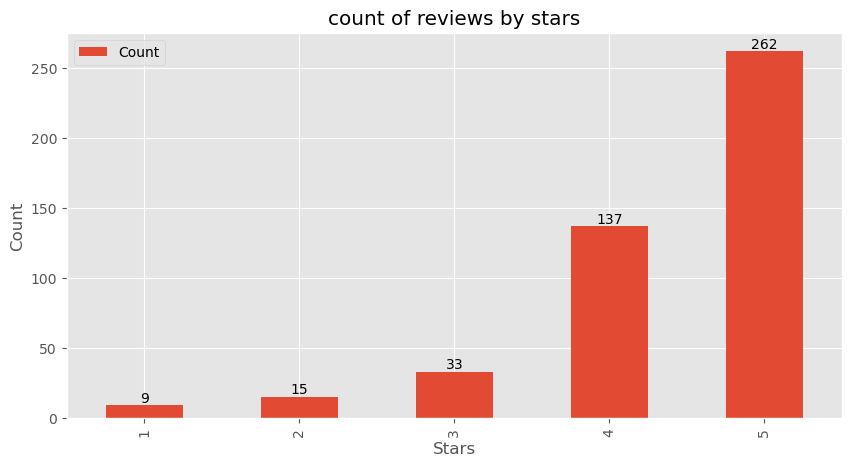

In [14]:
#bar chart count of reviews by stars
df['ratings'].value_counts().sort_index().plot(kind ='bar',title ='count of reviews by stars', figsize=(10,5))
# Adding labels to each bar
for i, v in enumerate(df['ratings'].value_counts().sort_index()):
    plt.text(i, v, str(v), ha='center', va='bottom')
plt.xlabel('Stars')
plt.ylabel('Count')
plt.legend(['Count'])

In [15]:
##Basic NLTK
example = df['comment'][10]
print(example)  

It was prescient that I was enjoying "White House Plumbers" (5-episode miniseries on MAX) concurrent with my visit to Nixon's presidential library.  It made me want to enter and run to wherever the "Watergate section" was but I demurred, and tried to approach the place in the order in which it presented itself.For unexplained reasons, I was told that the helicopter (in which Nixon permanently left the White House) and the home he was born in (both part of the offerings here) close earlier than the rest of the place so I beelined to those first.  Aside from taking the obligatory photo, peace-signs flashing, at the entrance to the chopper, there's no reason to spend much time on these things when so much more interesting stuff waits inside.  I allotted 2.5 hours here and it wasn't enough.  Yes, I'm the type who reads and listens to everything but even if that's not you, there's a lot to be absorbed as well as a lot to see (don't miss the opportunity to compare the gifts from other nation

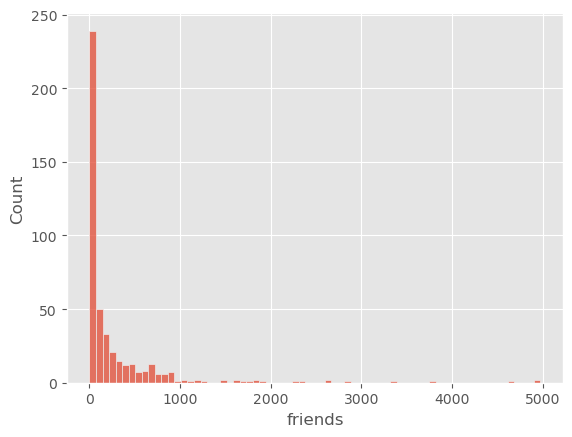

In [16]:
sns.histplot(df['friends'])
plt.show()

In [17]:
#Identifying tokens upto 100
tokens = nltk.word_tokenize(example)
tokens[:100]

['It',
 'was',
 'prescient',
 'that',
 'I',
 'was',
 'enjoying',
 '``',
 'White',
 'House',
 'Plumbers',
 "''",
 '(',
 '5-episode',
 'miniseries',
 'on',
 'MAX',
 ')',
 'concurrent',
 'with',
 'my',
 'visit',
 'to',
 'Nixon',
 "'s",
 'presidential',
 'library',
 '.',
 'It',
 'made',
 'me',
 'want',
 'to',
 'enter',
 'and',
 'run',
 'to',
 'wherever',
 'the',
 '``',
 'Watergate',
 'section',
 "''",
 'was',
 'but',
 'I',
 'demurred',
 ',',
 'and',
 'tried',
 'to',
 'approach',
 'the',
 'place',
 'in',
 'the',
 'order',
 'in',
 'which',
 'it',
 'presented',
 'itself.For',
 'unexplained',
 'reasons',
 ',',
 'I',
 'was',
 'told',
 'that',
 'the',
 'helicopter',
 '(',
 'in',
 'which',
 'Nixon',
 'permanently',
 'left',
 'the',
 'White',
 'House',
 ')',
 'and',
 'the',
 'home',
 'he',
 'was',
 'born',
 'in',
 '(',
 'both',
 'part',
 'of',
 'the',
 'offerings',
 'here',
 ')',
 'close',
 'earlier',
 'than',
 'the']

In [18]:
#Part of speech tagging for all the tokens (Format - ('part of speech', 'token'))
tagged = nltk.pos_tag(tokens)
tagged[:10]

[('It', 'PRP'),
 ('was', 'VBD'),
 ('prescient', 'JJ'),
 ('that', 'IN'),
 ('I', 'PRP'),
 ('was', 'VBD'),
 ('enjoying', 'VBG'),
 ('``', '``'),
 ('White', 'NNP'),
 ('House', 'NNP')]

In [19]:
entities = nltk.chunk.ne_chunk(tagged)
entities.pprint()

(S
  It/PRP
  was/VBD
  prescient/JJ
  that/IN
  I/PRP
  was/VBD
  enjoying/VBG
  ``/``
  (FACILITY White/NNP House/NNP)
  Plumbers/NNPS
  ''/''
  (/(
  5-episode/JJ
  miniseries/NNS
  on/IN
  (ORGANIZATION MAX/NNP)
  )/)
  concurrent/NN
  with/IN
  my/PRP$
  visit/NN
  to/TO
  (PERSON Nixon/NNP)
  's/POS
  presidential/JJ
  library/NN
  ./.
  It/PRP
  made/VBD
  me/PRP
  want/VB
  to/TO
  enter/VB
  and/CC
  run/VB
  to/TO
  wherever/VB
  the/DT
  ``/``
  Watergate/NNP
  section/NN
  ''/''
  was/VBD
  but/CC
  I/PRP
  demurred/VBD
  ,/,
  and/CC
  tried/VBD
  to/TO
  approach/VB
  the/DT
  place/NN
  in/IN
  the/DT
  order/NN
  in/IN
  which/WDT
  it/PRP
  presented/VBD
  itself.For/JJ
  unexplained/JJ
  reasons/NNS
  ,/,
  I/PRP
  was/VBD
  told/VBN
  that/IN
  the/DT
  helicopter/NN
  (/(
  in/IN
  which/WDT
  (PERSON Nixon/NNP)
  permanently/RB
  left/VBD
  the/DT
  (FACILITY White/NNP House/NNP)
  )/)
  and/CC
  the/DT
  home/NN
  he/PRP
  was/VBD
  born/VBN
  in/IN
  (/(
  both/D

In [20]:
import nltk
from nltk import sent_tokenize, word_tokenize, pos_tag, ne_chunk

# Sample text
text = """
(S It was prescient that I was enjoying `` White House Plumbers '' (5-episode miniseries on MAX) concurrent with my visit to Nixon's presidential library. It made me want to enter and run to wherever the `` Watergate section '' was but I demurred, and tried to approach the place in the order in which it presented itself. For unexplained reasons, I was told that the helicopter (in which Nixon permanently left the White House) and the home he was born in (both part of the offerings here) close earlier than the rest of the place, so I beelined to those first. Aside from taking the obligatory photo, peace-signs flashing, at the entrance to the chopper, there's no reason to spend much time on these things when so much more interesting stuff waits inside. I allotted 2.5 hours here and it wasn't enough. Yes, I'm the type who reads and listens to everything but even if that's not you, there's a lot to be absorbed as well as a lot to see (don't miss the opportunity to compare the gifts from other nations against one another; hint: the Saudis' on-brand gifting of precious gems is in a category of one). The order in which Nixon's life is presented here is non-linear and, dare I say, chaotic in some portions. Even the introductory film had me confused by where to look. But there's so much to see that I can forgive. Because a presidential library is a somewhat white-washed view of the president whose library it is, all the more reason here not to miss the detailed section on Watergate et al, which led to Nixon's resignation during his second term in office. If I had only 1 hour here, this is where I'd start and end. In case someone from the place is actually reading this I do have two suggestions: Offer folding, portable stools (as many museums do) for people to sit on while listening and watching what's here; and (Pivot) to displays that `` talk '' only when activated (or require headphones to hear). There's little worse than trying to comprehend what one is reading while there's unattended background narration from an entirely different display running on a continual loop. This is the second presidential library I've been to (FDR's was #1) and whether you're a lover of museums, history, or both, this'll do. It's interesting and engaging and worth the time. Admission fees top out at $28 per person with discounts offered for various categories but the best discount I've seen is that offer through Groupon so check there first. The Nixo"
"""

# Sentence Tokenization
sentences = sent_tokenize(text)

# Named Entity Recognition (NER)
words = nltk.word_tokenize(text)
pos_tags = nltk.pos_tag(words)
ner_result = ne_chunk(pos_tags)

# Displaying results
print("\n--- Sentences ---\n")
for i, sentence in enumerate(sentences):
    print(f"{i + 1}. {sentence}")

print("\n--- Named Entities ---\n")
print(ner_result)



--- Sentences ---

1. 
(S It was prescient that I was enjoying `` White House Plumbers '' (5-episode miniseries on MAX) concurrent with my visit to Nixon's presidential library.
2. It made me want to enter and run to wherever the `` Watergate section '' was but I demurred, and tried to approach the place in the order in which it presented itself.
3. For unexplained reasons, I was told that the helicopter (in which Nixon permanently left the White House) and the home he was born in (both part of the offerings here) close earlier than the rest of the place, so I beelined to those first.
4. Aside from taking the obligatory photo, peace-signs flashing, at the entrance to the chopper, there's no reason to spend much time on these things when so much more interesting stuff waits inside.
5. I allotted 2.5 hours here and it wasn't enough.
6. Yes, I'm the type who reads and listens to everything but even if that's not you, there's a lot to be absorbed as well as a lot to see (don't miss the op

In [21]:
# Function for segmentation analysis
def perform_segmentation_analysis(text):
    # Sentence Tokenization
    sentences = sent_tokenize(text)

    # Named Entity Recognition (NER)
    words = nltk.word_tokenize(text)
    pos_tags = nltk.pos_tag(words)
    ner_result = ne_chunk(pos_tags)

    return sentences, ner_result

# Applying segmentation analysis to the 'comment' column
df['sentences'], df['ner_result'] = zip(*df['comment'].apply(perform_segmentation_analysis))

# Displaying the result
for index, row in df.iterrows():
    print(f"\n--- {row['name']}'s Comment ---\n")
    print(f"Original Comment: {row['comment']}\n")
    
    print("--- Sentences ---\n")
    for i, sentence in enumerate(row['sentences']):
        print(f"{i + 1}. {sentence}")

    print("\n--- Named Entities ---\n")
    print(row['ner_result'])


--- Johnnie C.'s Comment ---

Original Comment: We went here in a whim, as I have wanted to go for over a year. Admission was $28 a piece, with free admission for current military. I received a $6 discount for being a veteran. Guys, this place was huge and has sooo much information and exhibits, it was amazing! Richard Nixon- there was more to him than WaterGate or the Vietnam War. My wife enjoyed it, and she is not easy to please. You need at least 3 hours or more to really do it right. I loved the rose garden and Nixon's birthplace (house), which is in the rear of the property. A great field trip or college project. I'm returning.

--- Sentences ---

1. We went here in a whim, as I have wanted to go for over a year.
2. Admission was $28 a piece, with free admission for current military.
3. I received a $6 discount for being a veteran.
4. Guys, this place was huge and has sooo much information and exhibits, it was amazing!
5. Richard Nixon- there was more to him than WaterGate or the

In [22]:
# Function for detailed segmentation analysis
def detailed_segmentation_analysis(text):
    sentences = sent_tokenize(text)
    words = nltk.word_tokenize(text)
    pos_tags = nltk.pos_tag(words)
    ner_result = ne_chunk(pos_tags)
    
    # Token meanings based on POS
    token_meanings = {'Noun': [], 'Adjective': [], 'Adverb': []}
    for word, pos in pos_tags:
        if pos.startswith('N'):  # Noun
            token_meanings['Noun'].append(word)
        elif pos.startswith('J'):  # Adjective
            token_meanings['Adjective'].append(word)
        elif pos.startswith('R'):  # Adverb
            token_meanings['Adverb'].append(word)

    # Sentiment analysis
    blob = TextBlob(text)
    sentiment = blob.sentiment

    return sentences, ner_result, token_meanings, sentiment

# Additional analysis
df['detailed_analysis'] = df['comment'].apply(detailed_segmentation_analysis)

# Displaying the result
for index, row in df.iterrows():
    print(f"\n--- {row['name']}'s Comment ---\n")
    print(f"Original Comment: {row['comment']}\n")

    # Displaying sentences
    print("--- Sentences ---\n")
    for i, sentence in enumerate(row['detailed_analysis'][0]):
        print(f"{i + 1}. {sentence}")

    # Displaying named entities
    print("\n--- Named Entities ---\n")
    print(row['detailed_analysis'][1])

    # Displaying token meanings
    print("\n--- Token Meanings ---\n")
    for pos, tokens in row['detailed_analysis'][2].items():
        print(f"{pos}s: {', '.join(tokens)}")

    # Displaying sentiment analysis
    print("\n--- Sentiment Analysis ---\n")
    print(f"Polarity: {row['detailed_analysis'][3].polarity}")
    print(f"Subjectivity: {row['detailed_analysis'][3].subjectivity}")

# Analyzing correlation between users' locations and sentiments
location_sentiment_correlation = df.groupby('location')['detailed_analysis'].apply(lambda x: sum(y[3].polarity for y in x) / len(x))
print("\n--- Location and Sentiment Correlation ---\n")
print(location_sentiment_correlation)


--- Johnnie C.'s Comment ---

Original Comment: We went here in a whim, as I have wanted to go for over a year. Admission was $28 a piece, with free admission for current military. I received a $6 discount for being a veteran. Guys, this place was huge and has sooo much information and exhibits, it was amazing! Richard Nixon- there was more to him than WaterGate or the Vietnam War. My wife enjoyed it, and she is not easy to please. You need at least 3 hours or more to really do it right. I loved the rose garden and Nixon's birthplace (house), which is in the rear of the property. A great field trip or college project. I'm returning.

--- Sentences ---

1. We went here in a whim, as I have wanted to go for over a year.
2. Admission was $28 a piece, with free admission for current military.
3. I received a $6 discount for being a veteran.
4. Guys, this place was huge and has sooo much information and exhibits, it was amazing!
5. Richard Nixon- there was more to him than WaterGate or the


--- Megan C.'s Comment ---

Original Comment: Great museum, could have spent all day there. The guides were very helpful and informative. There was so much to see. My favorite was Marine One the helicopter and the rose gardens. I recommend this museum to everyone.

--- Sentences ---

1. Great museum, could have spent all day there.
2. The guides were very helpful and informative.
3. There was so much to see.
4. My favorite was Marine One the helicopter and the rose gardens.
5. I recommend this museum to everyone.

--- Named Entities ---

(S
  (GPE Great/NNP)
  museum/NN
  ,/,
  could/MD
  have/VB
  spent/VBN
  all/DT
  day/NN
  there/RB
  ./.
  The/DT
  guides/NNS
  were/VBD
  very/RB
  helpful/JJ
  and/CC
  informative/JJ
  ./.
  There/EX
  was/VBD
  so/RB
  much/JJ
  to/TO
  see/VB
  ./.
  My/PRP$
  favorite/NN
  was/VBD
  (PERSON Marine/NNP One/NNP)
  the/DT
  helicopter/NN
  and/CC
  the/DT
  rose/VBD
  gardens/NNS
  ./.
  I/PRP
  recommend/VBP
  this/DT
  museum/NN
  to/TO
  ever

C:\ProgramData\miniconda3\envs\SA\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


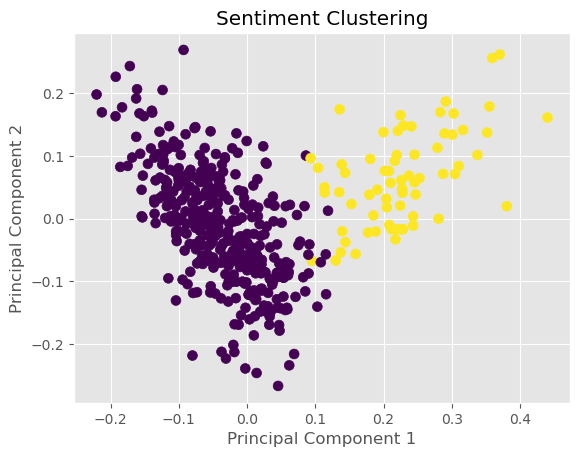


--- Johnnie C.'s Comment ---

Original Comment: We went here in a whim, as I have wanted to go for over a year. Admission was $28 a piece, with free admission for current military. I received a $6 discount for being a veteran. Guys, this place was huge and has sooo much information and exhibits, it was amazing! Richard Nixon- there was more to him than WaterGate or the Vietnam War. My wife enjoyed it, and she is not easy to please. You need at least 3 hours or more to really do it right. I loved the rose garden and Nixon's birthplace (house), which is in the rear of the property. A great field trip or college project. I'm returning.

--- Sentences ---

1. We went here in a whim, as I have wanted to go for over a year.
2. Admission was $28 a piece, with free admission for current military.
3. I received a $6 discount for being a veteran.
4. Guys, this place was huge and has sooo much information and exhibits, it was amazing!
5. Richard Nixon- there was more to him than WaterGate or the

28. And it's considerably less than, say, Disney.
29. Given that you can kill several hours there (we managed to kill an entire afternoon), it's very affordable.

--- Named Entities ---

(S
  Actually/RB
  ,/,
  more/JJR
  like/IN
  3/CD
  1/2/CD
  ,/,
  but/CC
  (PERSON Yelp/NNP)
  does/VBZ
  n't/RB
  allow/VB
  for/IN
  1/2/CD
  star/NN
  ratings/NNS
  ..../VBP
  Things/NNP
  I/PRP
  liked/VBD
  about/IN
  the/DT
  library/NN
  (/(
  full/JJ
  disclosure/NN
  :/:
  I/PRP
  'm/VBP
  a/DT
  Democrat/NNP
  )/)
  :1/NN
  ./.
  The/DT
  chance/NN
  to/TO
  learn/VB
  more/JJR
  about/IN
  Nixon/NNP
  the/DT
  person/NN
  ./.
  He/PRP
  actually/RB
  had/VBD
  a/DT
  wry/JJ
  sense/NN
  of/IN
  humor/NN
  (/(
  calling/VBG
  writing/VBG
  'Six/CD
  Crises/NNP
  '/POS
  his/PRP$
  'seventh/JJ
  crisis/NN
  )/)
  ,/,
  which/WDT
  I/PRP
  never/RB
  knew/VBD
  or/CC
  heard/VBN
  about/IN
  (/(
  the/DT
  'enemies/NNPS
  list/NN
  ,/,
  '/''
  on/IN
  the/DT
  other/JJ
  hand/NN
  ../NNP
  )

In [23]:
# Function for cleaning text
def clean_text(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text, re.I | re.A)
    return text.lower()

# Apply text cleaning
df['cleaned_comments'] = df['comment'].apply(clean_text)

# Function for sentiment analysis using NLTK
def analyze_sentiment(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_score = sid.polarity_scores(text)['compound']
    return 'positive' if sentiment_score >= 0 else 'negative'

# Apply sentiment analysis
df['sentiment'] = df['cleaned_comments'].apply(analyze_sentiment)

# Function for clustering using TF-IDF and KMeans
def cluster_comments(comments, num_clusters=2):
    tfidf_vectorizer = TfidfVectorizer(stop_words='english')
    tfidf_matrix = tfidf_vectorizer.fit_transform(comments)

    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(tfidf_matrix)

    pca = PCA(n_components=2)
    reduced_features = pca.fit_transform(tfidf_matrix.toarray())

    df['cluster'] = kmeans.labels_

    return reduced_features

# Cluster comments
reduced_features = cluster_comments(df['cleaned_comments'])

# Visualize clusters
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=df['cluster'], cmap='viridis', s=50)
plt.title('Sentiment Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Function for detailed segmentation analysis
def detailed_segmentation_analysis(text):
    sentences = sent_tokenize(text)
    words = nltk.word_tokenize(text)
    pos_tags = pos_tag(words)
    ner_result = ne_chunk(pos_tags)
    
    # Token meanings based on POS
    token_meanings = {'Noun': [], 'Adjective': [], 'Adverb': []}
    for word, pos in pos_tags:
        if pos.startswith('N'):  # Noun
            token_meanings['Noun'].append(word)
        elif pos.startswith('J'):  # Adjective
            token_meanings['Adjective'].append(word)
        elif pos.startswith('R'):  # Adverb
            token_meanings['Adverb'].append(word)

    # Sentiment analysis
    blob = TextBlob(text)
    sentiment = blob.sentiment

    return sentences, ner_result, token_meanings, sentiment

# Additional analysis
df['detailed_analysis'] = df['comment'].apply(detailed_segmentation_analysis)

# Displaying the result
for index, row in df.iterrows():
    print(f"\n--- {row['name']}'s Comment ---\n")
    print(f"Original Comment: {row['comment']}\n")

    # Displaying sentences
    print("--- Sentences ---\n")
    for i, sentence in enumerate(row['detailed_analysis'][0]):
        print(f"{i + 1}. {sentence}")

    # Displaying named entities
    print("\n--- Named Entities ---\n")
    print(row['detailed_analysis'][1])

    # Displaying token meanings
    print("\n--- Token Meanings ---\n")
    for pos, tokens in row['detailed_analysis'][2].items():
        print(f"{pos}s: {', '.join(tokens)}")

    # Displaying sentiment analysis
    print("\n--- Sentiment Analysis ---\n")
    print(f"Polarity: {row['detailed_analysis'][3].polarity}")
    print(f"Subjectivity: {row['detailed_analysis'][3].subjectivity}")

# Analyzing correlation between users' locations and sentiments
location_sentiment_correlation = df.groupby('location')['detailed_analysis'].apply(lambda x: sum(y[3].polarity for y in x) / len(x))
print("\n--- Location and Sentiment Correlation ---\n")
print(location_sentiment_correlation)

In [24]:
#VADER Sentiment Score (Valence Aware Dictionary and Sentiment Reasoner )
# we will use NLTK's SentimentIntensityAnalyzer to get the neg/neu/pos scores of the text.

#This uses a "bag of words" approach: 1. Stop words are removed 2. each word is scored and combined to a total score.

from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm

sia = SentimentIntensityAnalyzer()

In [25]:
#Run the polarity score on example that we parsed above
sia.polarity_scores(example)

{'neg': 0.048, 'neu': 0.856, 'pos': 0.096, 'compound': 0.9683}

In [26]:
#Run the polarity score on the entire dataset
res = {}
for i, row in tqdm(df.iterrows(), total = len(df)):
    text = row['comment']
    res[text] = sia.polarity_scores(text)


  0%|          | 0/456 [00:00<?, ?it/s]

In [27]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Create a SentimentIntensityAnalyzer object
sia = SentimentIntensityAnalyzer()

# Create empty lists to store sentiment scores
res = {'neg': [], 'neu': [], 'pos': [], 'compound': []}

# Iterate over the data and calculate the sentiment scores for each row
for i, row in df.iterrows():
    text = row['comment']
    scores = sia.polarity_scores(text)
    res['neg'].append(scores['neg'])
    res['neu'].append(scores['neu'])
    res['pos'].append(scores['pos'])
    res['compound'].append(scores['compound'])

# Create a new DataFrame from the sentiment scores
vaders = pd.DataFrame(res)

# Merge the sentiment scores DataFrame with the original DataFrame based on the row index
merged_df = df.join(vaders)

# Now, 'merged_df' contains both the original data and sentiment scores

# Print the entire merged dataset
print(merged_df)

             name  elite           location  friends  review_count  pictures  \
0      Johnnie C.      1    Los Angeles, CA        2            60        74   
1     Patricia B.      0      Santa Ana, CA        6            47         3   
2         Emil C.      1         Irvine, CA      491          1926     10196   
3           Ed L.      1  Orange County, CA      455           323     10146   
4    Christine M.      1       Whittier, CA      172           141      2118   
..            ...    ...                ...      ...           ...       ...   
451       Anne F.      0    Yorba Linda, CA        0            17         1   
452      Julie S.      0   Palmetto Bay, FL        0             8         0   
453          m c.      0        Ventura, CA        0            26         1   
454       mike s.      0     Long Beach, CA        0           113         0   
455     Kathey B.      0        Anaheim, CA        0             9         0   

     ratings review_date  is_review_upd

<function matplotlib.pyplot.show(close=None, block=None)>

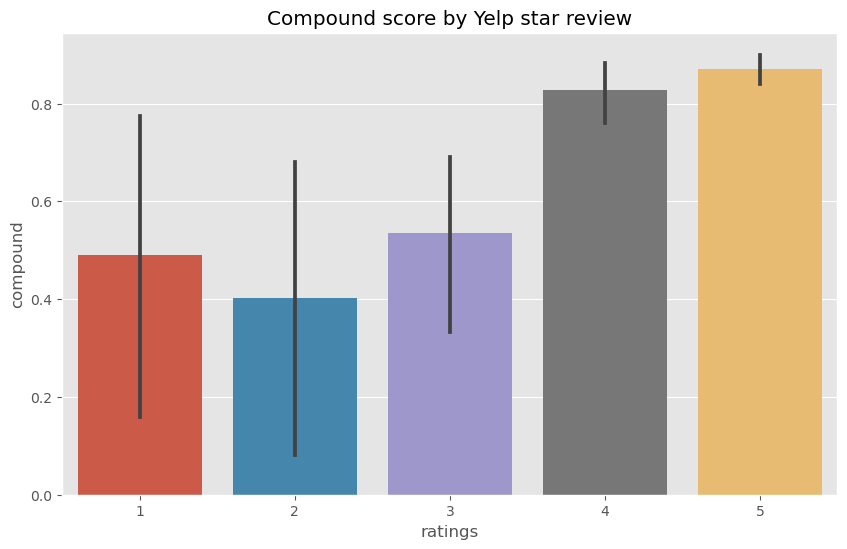

In [28]:
#Plot Vader results (we are plotting the over all compound ratings with respect to the ratings)
plt.figure(figsize=(10, 6))
sns.barplot(data=merged_df, x ='ratings', y='compound')
plt.title('Compound score by Yelp star review')
plt.show

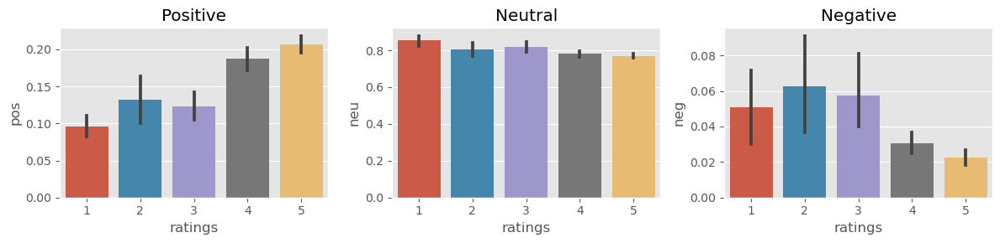

In [29]:
fig, axs = plt.subplots(1,3,figsize=(12,3))
sns.barplot(data=merged_df, x ='ratings', y ='pos',ax= axs[0])
sns.barplot(data=merged_df, x ='ratings', y ='neu',ax = axs[1])
sns.barplot(data=merged_df, x ='ratings', y ='neg',ax = axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

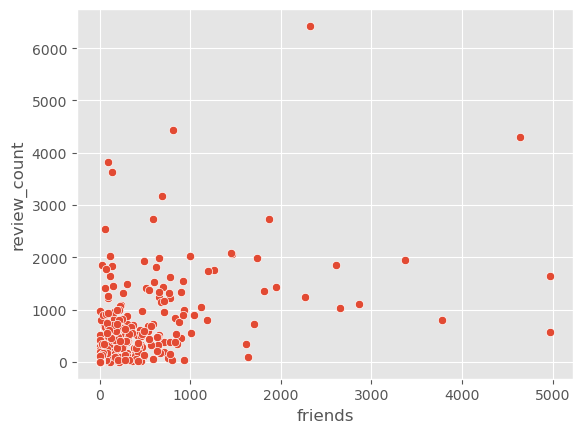

In [30]:
sns.scatterplot(x='friends', y='review_count', data=df)
plt.show()

100%|███████████████████████████████████████████████████████████████████████████████| 456/456 [00:01<00:00, 270.19it/s]
C:\ProgramData\miniconda3\envs\SA\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


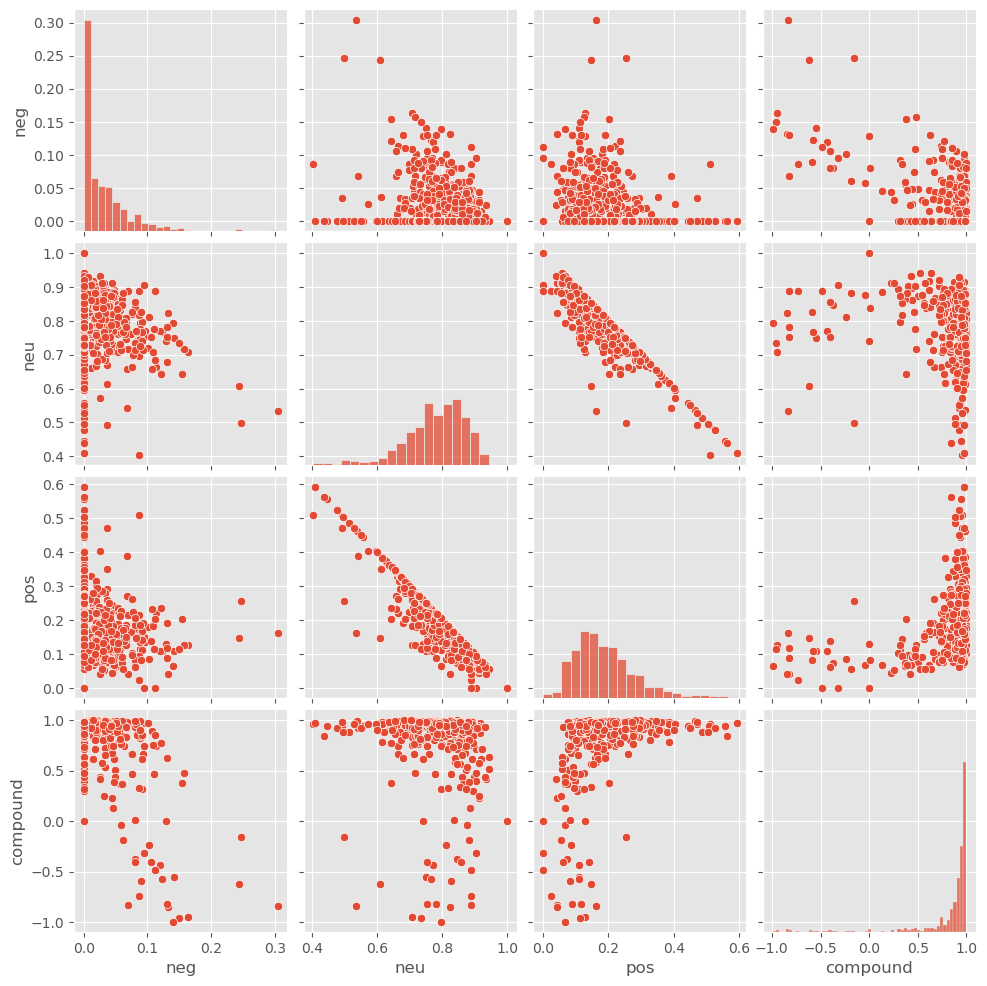

In [31]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from tqdm import tqdm
import seaborn as sns

# Create a SentimentIntensityAnalyzer object
sia = SentimentIntensityAnalyzer()

# Initialize the progress bar with tqdm
tqdm.pandas()

# Create an empty DataFrame to store sentiment scores
res = pd.DataFrame(columns=['neg', 'neu', 'pos', 'compound'])

# Iterate over the data and calculate the sentiment scores for each row
for i, row in tqdm(df.iterrows(), total=len(df)):
    text = row['comment']
    scores = sia.polarity_scores(text)
    scores_df = pd.DataFrame(scores, index=[i])  # Create a DataFrame with an index
    res = pd.concat([res, scores_df], ignore_index=True)

# Create a pairplot to visualize the correlations
sns.pairplot(res)
plt.show()


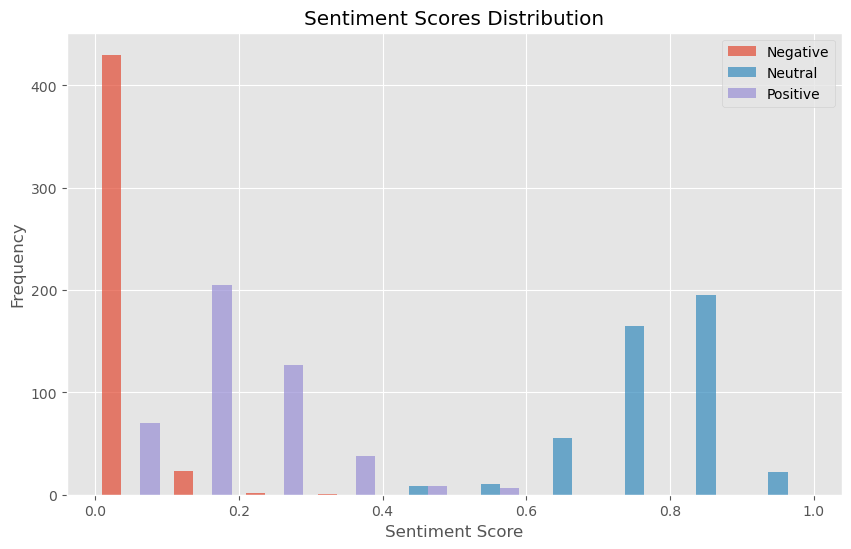

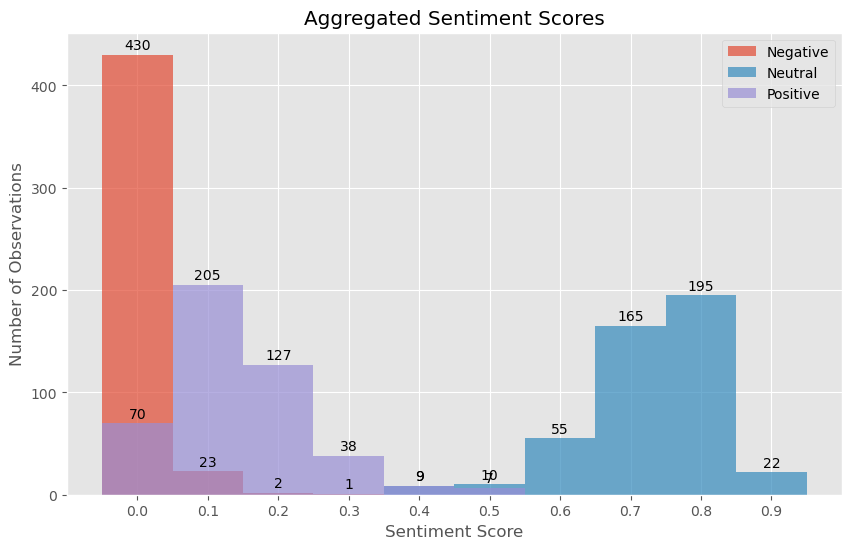

In [32]:
# Create a SentimentIntensityAnalyzer object
sia = SentimentIntensityAnalyzer()

# Create empty lists to store sentiment scores
neg_scores = []
neu_scores = []
pos_scores = []

# Iterate over the data and calculate the sentiment scores for each row
for _, row in df.iterrows():
    text = row['comment']
    scores = sia.polarity_scores(text)
    neg_scores.append(scores['neg'])
    neu_scores.append(scores['neu'])
    pos_scores.append(scores['pos'])

# Plot sentiment scores in general
plt.figure(figsize=(10, 6))
plt.hist([neg_scores, neu_scores, pos_scores], bins=10, label=['Negative', 'Neutral', 'Positive'], alpha=0.7)
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.title('Sentiment Scores Distribution')
plt.legend()

# Create a bar chart for aggregated sentiment scores
plt.figure(figsize=(10, 6))
hist, edges = np.histogram(neg_scores, bins=np.arange(0, 1.1, 0.1))
hist_neu, edges_neu = np.histogram(neu_scores, bins=np.arange(0, 1.1, 0.1))
hist_pos, edges_pos = np.histogram(pos_scores, bins=np.arange(0, 1.1, 0.1))

plt.bar(edges[:-1], hist, width=0.1, align='center', label='Negative', alpha=0.7)
plt.bar(edges_neu[:-1], hist_neu, width=0.1, align='center', label='Neutral', alpha=0.7)
plt.bar(edges_pos[:-1], hist_pos, width=0.1, align='center', label='Positive', alpha=0.7)
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Observations')
plt.title('Aggregated Sentiment Scores')
plt.xticks(edges[:-1], [f'{i:.1f}' for i in edges[:-1]])
plt.legend()

# Add numerical counts on top of each bar, ignoring 0 counts
for x, y in zip(edges[:-1], hist):
    if y != 0:
        plt.text(x, y + 5, str(y), ha='center')
for x, y in zip(edges_neu[:-1], hist_neu):
    if y != 0:
        plt.text(x, y + 5, str(y), ha='center')
for x, y in zip(edges_pos[:-1], hist_pos):
    if y != 0:
        plt.text(x, y + 5, str(y), ha='center')

plt.show()


In [33]:
# Create lists to store the results
polarity_list = []
subjectivity_list = []
sentiment_assessments_list = []

# Iterate over the content column in the DataFrame
for row in df['comment']:
    doc = SA_model(row)

    # Get the sentiment polarity and subjectivity
    polarity = doc._.blob.polarity
    subjectivity = doc._.blob.subjectivity

    # Get the sentiment assessments
    sentiment_assessments = doc._.blob.sentiment_assessments.assessments

    # Append the results to the respective lists
    polarity_list.append(polarity)
    subjectivity_list.append(subjectivity)
    sentiment_assessments_list.append(sentiment_assessments)

# Create a new DataFrame from the results
results_df = pd.DataFrame({
    'Polarity': polarity_list,
    'Subjectivity': subjectivity_list,
    'Sentiment Assessments': sentiment_assessments_list
})

# Print the results DataFrame
print(results_df)

     Polarity  Subjectivity                              Sentiment Assessments
0    0.313690      0.579315  [([free], 0.4, 0.8, None), ([current], 0.0, 0....
1    0.115652      0.487609  [([less], -0.16666666666666666, 0.066666666666...
2    0.141776      0.561706  [([only], 0.0, 1.0, None), ([live], 0.13636363...
3    0.186111      0.470062  [([first], 0.25, 0.3333333333333333, None), ([...
4    0.478571      0.714286  [([third], 0.0, 0.0, None), ([beautiful], 0.85...
..        ...           ...                                                ...
451 -0.112500      0.616667  [([cool], 0.35, 0.65, None), ([little], -0.187...
452  0.167500      0.335000  [([outstanding, !], 0.625, 0.875, None), ([spe...
453  0.108333      0.666667  [([nice], 0.6, 1.0, None), ([previous], -0.166...
454 -0.002713      0.523201  [([mostly], 0.5, 0.5, None), ([secondarily], -...
455  0.109563      0.483263  [([surprised], 0.1, 0.9, None), ([free], 0.4, ...

[456 rows x 3 columns]


In [34]:
## Roberta Pretrained Model
### Use a model trained of a large corpus of data
### Transformer model accounts for the words but also the context realted to other words.

from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax


In [35]:
# Load the pre-trained model and tokenizer
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

In [36]:
#VADER results on example
print(example)
sia.polarity_scores(example)

It was prescient that I was enjoying "White House Plumbers" (5-episode miniseries on MAX) concurrent with my visit to Nixon's presidential library.  It made me want to enter and run to wherever the "Watergate section" was but I demurred, and tried to approach the place in the order in which it presented itself.For unexplained reasons, I was told that the helicopter (in which Nixon permanently left the White House) and the home he was born in (both part of the offerings here) close earlier than the rest of the place so I beelined to those first.  Aside from taking the obligatory photo, peace-signs flashing, at the entrance to the chopper, there's no reason to spend much time on these things when so much more interesting stuff waits inside.  I allotted 2.5 hours here and it wasn't enough.  Yes, I'm the type who reads and listens to everything but even if that's not you, there's a lot to be absorbed as well as a lot to see (don't miss the opportunity to compare the gifts from other nation

{'neg': 0.046, 'neu': 0.863, 'pos': 0.09, 'compound': 0.9646}

In [37]:
# Run for Roberta Model
encoded_text = tokenizer(example,padding='max_length', truncation=True, max_length=512, return_tensors='pt')
output = model(**encoded_text)
scores = output.logits[0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_neg':scores[0],
    'roberta_neu':scores[1],
    'roberta_pos':scores[2],
}
print(scores_dict)

{'roberta_neg': 0.40837064, 'roberta_neu': 0.4617027, 'roberta_pos': 0.12992665}


In [38]:
def polarity_scores_roberta(example):
    encoded_text = tokenizer(example,padding='max_length', truncation=True, max_length=512, return_tensors='pt')
    output = model(**encoded_text)
    scores = output.logits[0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
    'roberta_neg':scores[0],
    'roberta_neu':scores[1],
    'roberta_pos':scores[2],
}
    return scores_dict

In [39]:
# Initialize an empty list to store the results
results = []
for i, row in tqdm(df.iterrows(), total = len(df)):
    text = row['comment']
    vader_result = sia.polarity_scores(text)
    vader_result_rename = {}
    
    # Rename VADER keys to avoid naming conflicts
    for key, value in vader_result.items():
        vader_result_rename[f"vader_{key}"] = value
    roberta_result = polarity_scores_roberta(text)
    
    # Combine VADER and Roberta results into a single dictionary
    both = {**vader_result_rename, **roberta_result}
    
    # Append the result to the list
    results.append(both)
    
# Convert the list of dictionaries to a DataFrame
results_df = pd.DataFrame(results)

# Print the results DataFrame
print(results_df)

100%|████████████████████████████████████████████████████████████████████████████████| 456/456 [35:41<00:00,  4.70s/it]

     vader_neg  vader_neu  vader_pos  vader_compound  roberta_neg  \
0        0.062      0.782      0.156          0.9290     0.002640   
1        0.000      0.842      0.158          0.9894     0.003333   
2        0.013      0.896      0.091          0.9787     0.014309   
3        0.035      0.890      0.076          0.7557     0.016924   
4        0.000      0.835      0.165          0.9217     0.001454   
..         ...        ...        ...             ...          ...   
451      0.000      0.874      0.126          0.3182     0.051846   
452      0.000      0.783      0.217          0.8650     0.004952   
453      0.081      0.857      0.061         -0.4019     0.476187   
454      0.061      0.882      0.056         -0.1825     0.436378   
455      0.043      0.873      0.083          0.9437     0.090846   

     roberta_neu  roberta_pos  
0       0.013809     0.983551  
1       0.025859     0.970808  
2       0.321452     0.664239  
3       0.151751     0.831325  
4       0.0

In [40]:
# Merge the original dataset with the results DataFrame 
merged_df = df.merge(results_df, left_index=True, right_index=True)

# Save the merged DataFrame to a new Excel file
merged_df.to_excel('yelp_reviews_with_results.xlsx', index=False)

In [41]:
print(merged_df)

             name  elite           location  friends  review_count  pictures  \
0      Johnnie C.      1    Los Angeles, CA        2            60        74   
1     Patricia B.      0      Santa Ana, CA        6            47         3   
2         Emil C.      1         Irvine, CA      491          1926     10196   
3           Ed L.      1  Orange County, CA      455           323     10146   
4    Christine M.      1       Whittier, CA      172           141      2118   
..            ...    ...                ...      ...           ...       ...   
451       Anne F.      0    Yorba Linda, CA        0            17         1   
452      Julie S.      0   Palmetto Bay, FL        0             8         0   
453          m c.      0        Ventura, CA        0            26         1   
454       mike s.      0     Long Beach, CA        0           113         0   
455     Kathey B.      0        Anaheim, CA        0             9         0   

     ratings review_date  is_review_upd

In [42]:
merged_df.columns

Index(['name', 'elite', 'location', 'friends', 'review_count', 'pictures',
       'ratings', 'review_date', 'is_review_updated', 'photos', 'check_ins',
       'comment', 'Useful', 'Funny', 'Cool', 'sentences', 'ner_result',
       'detailed_analysis', 'cleaned_comments', 'sentiment', 'cluster',
       'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound', 'roberta_neg',
       'roberta_neu', 'roberta_pos'],
      dtype='object')

C:\ProgramData\miniconda3\envs\SA\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


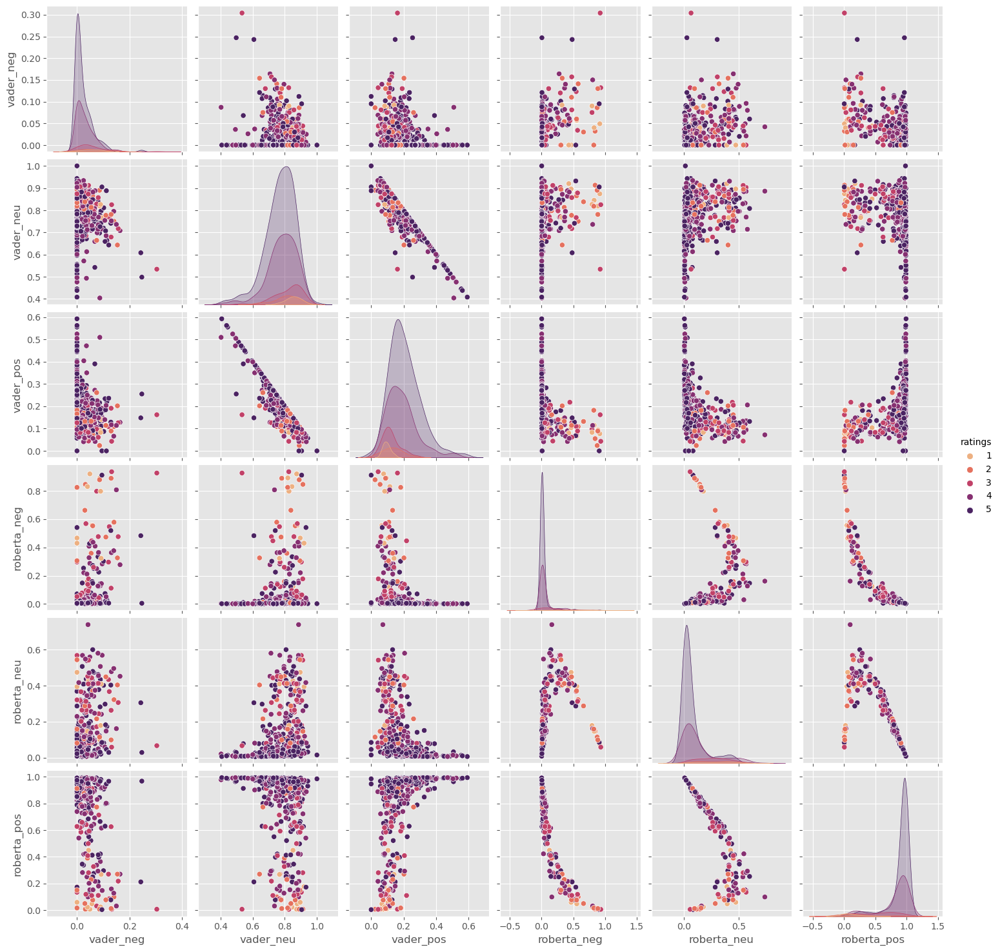

In [43]:
#Compare Scores between models
sns.pairplot(data=merged_df,
            vars = ['vader_neg', 'vader_neu',
       'vader_pos', 'roberta_neg', 'roberta_neu',
       'roberta_pos'], hue = 'ratings', palette='flare')
plt.show()

In [44]:
#Review Examples
##Positive 1-Star and Negative 5=Star Review


##This is for roberta model where the rating is 1 however rating score is +ve

# Check if there are any rows with Ratings equal to 1 or 2
ratings_1_and_2_reviews_roberta = merged_df.query('ratings == 1 or ratings == 2')

if not ratings_1_and_2_reviews_roberta.empty:
    # Sort the 1 and 2-star reviews by 'roberta_pos' in descending order
    sorted_reviews_roberta = ratings_1_and_2_reviews_roberta.sort_values('roberta_pos', ascending=False)
    
    # Get the content of the top review
    top_ratings_1_and_2_review_roberta = sorted_reviews_roberta['comment'].values[0]
    
    print(top_ratings_1_and_2_review_roberta)
else:
    print("No ratings 1 or 2 reviews found for Roberta model.")


Only because the main exhibit is closed until Oct of 2016. Otherwise the volunteer staff were very helpful and nice. The only exhibit that is open is the birth house and the helicopter.


In [45]:
##This is for vader model where the rating is 1 however rating score is +ve
##This model uses bag of words technique
merged_df.query('ratings ==1').sort_values('vader_pos',ascending = False)['comment'].values[0]

'SAD! Fourth of July. National Holiday. Pay up. Showed up for concert - it was free. Had to stand in lobby with 50 people. These older folks could have gone to the inner lobby to sit down but the AMAZING docents and STELLAR security felt it was wise to make everyone stand. Canes with elderly people would dictate "Let them sit!"No discount for veterans. Massive empty exhibit space. The kicker was my wife had to take her backpack back to the car. No backpacks. It fits makeup and a wallet. You couldn\'t fit a softball in it. But giant grandma purses were allowed. As a teacher I would never bring my students here. I\'ve been to the Reagan, FDR, and Kennedy. The Nixon is the weakest museum on touring and interactive exhibits. Long story short... Drive to Simi Valley to see a good Presidential Library.'

In [46]:
#negative sentiment 5-star review
merged_df.query('ratings ==5').sort_values('roberta_neg',ascending = False)['comment'].values[0]

"If you live in Southern California and you don't visit the birthplace of our 37th president, you should punch yourself in the nuts."

In [47]:
#negative sentiment 5-star review in vader model
merged_df.query('ratings ==5').sort_values('vader_neg',ascending = False)['comment'].values[0]

'Beautiful museum and grounds. \xa0It was a good museum before, but after the remodel it is perfect. \xa0All Nixon the \xa0good and the bad, nothing hidden. \xa0Happy and sad times. \xa0And many memories.'

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.out_proj.bias', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Word	Frequency
museum	187
library	184
place	175
history	127
great	125
wedding	114
time	112
beautiful	111
presidential	83
nice	80
helicopter	75
lot	69
house	66
venue	66
exhibits	60
visit	60
day	59
good	58
president	57
life	57
more	56
tour	52
grounds	52
home	51
many	50
interesting	49
garden	48
exhibit	47
people	45
staff	45
first	44
things	44
much	43
free	40
hours	39
other	39
little	39
amazing	38
years	38
experience	37
cool	37
informative	36
worth	34
parking	34
admission	32
room	32
family	32
libraries	32
presidency	31
way	30


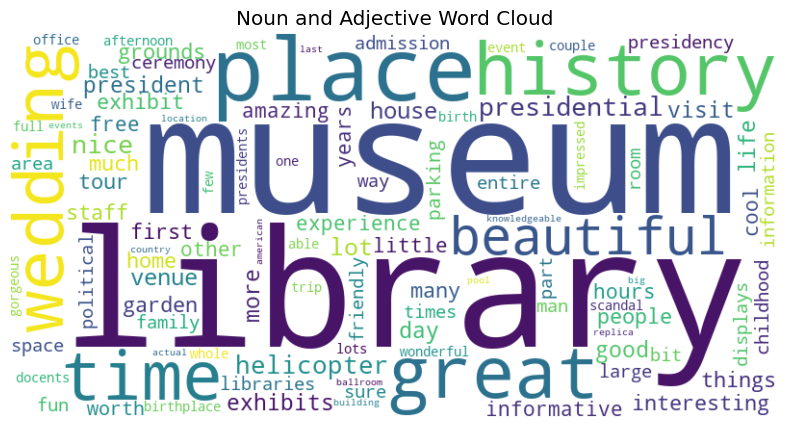

In [48]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import spacy
import pandas as pd

# Initialize NLTK VADER
sia = SentimentIntensityAnalyzer()

# Initialize Hugging Face Roberta model and tokenizer
model_name = 'roberta-base'
model = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Initialize a list of words to remove
words_to_remove = ["nixon", "museum"]

# Initialize spaCy with a language model (English)
nlp = spacy.load("en_core_web_sm")

# Initialize empty word frequency counters for nouns and adjectives
noun_adjective_counts = Counter()

for i, row in df.iterrows():
    text = row['comment']
    vader_result = sia.polarity_scores(text)

    # Truncate or split the text to fit within the model's maximum sequence length
    max_seq_length = model.config.max_position_embeddings
    if len(text) > max_seq_length:
        text = text[:max_seq_length]  # Truncate the text

    roberta_result = model(**tokenizer(text, return_tensors='pt', padding=True, truncation=True))

    # Process the text with spaCy to extract nouns and adjectives and update the word frequency counts
    doc = nlp(text)
    noun_adjective_tokens = [token.text.lower() for token in doc if token.pos_ in ['NOUN', 'ADJ']]
    noun_adjective_counts.update(noun_adjective_tokens)

# Get the top 50 words with their frequencies in increasing order
top_50_words = noun_adjective_counts.most_common(50)

# Print the table
print("Word\tFrequency")
for word, frequency in top_50_words:
    print(f"{word}\t{frequency}")

# Create a word cloud for the combined noun and adjective counts
def generate_word_cloud(word_counts, title):
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate_from_frequencies(word_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

generate_word_cloud(noun_adjective_counts, "Noun and Adjective Word Cloud")


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.out_proj.bias', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Word	Frequency
great	125
beautiful	111
presidential	83
nice	80
good	57
more	56
many	50
interesting	49
first	44
much	43
free	40
other	39
little	39
amazing	38
cool	37
informative	36
worth	34
entire	29
friendly	28
best	26
large	26
sure	25
political	25
whole	22
most	20
impressed	20
few	20
wonderful	19
gorgeous	19
able	19
full	18
knowledgeable	18
american	18
big	18
last	17
actual	17
special	17
helpful	16
clean	16
incredible	16
better	16
open	16
huge	15
easy	15
old	15
small	15
perfect	15
favorite	15
surprised	14
historical	14


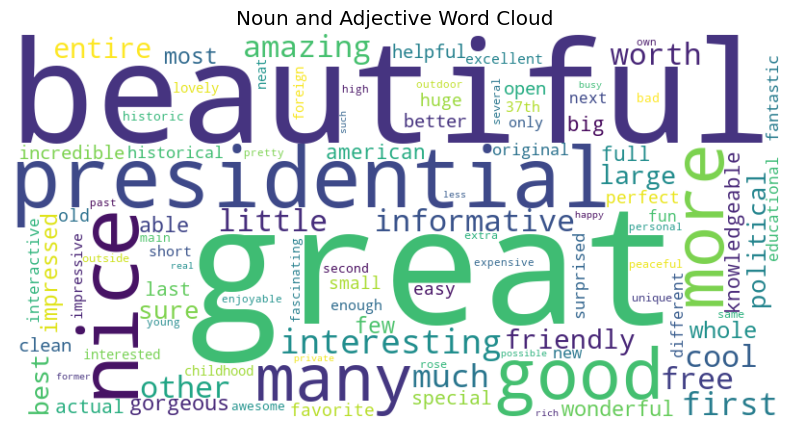

In [49]:
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import spacy
import pandas as pd

# Initialize NLTK VADER
sia = SentimentIntensityAnalyzer()

# Initialize Hugging Face Roberta model and tokenizer
model_name = 'roberta-base'
model = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Initialize a list of words to remove
words_to_remove = ["nixon", "museum"]

# Initialize spaCy with a language model (English)
nlp = spacy.load("en_core_web_sm")

# Initialize empty word frequency counters for nouns and adjectives
noun_adjective_counts = Counter()

for i, row in df.iterrows():
    text = row['comment']
    vader_result = sia.polarity_scores(text)

    # Truncate or split the text to fit within the model's maximum sequence length
    max_seq_length = model.config.max_position_embeddings
    if len(text) > max_seq_length:
        text = text[:max_seq_length]  # Truncate the text

    roberta_result = model(**tokenizer(text, return_tensors='pt', padding=True, truncation=True))

    # Process the text with spaCy to extract nouns and adjectives and update the word frequency counts
    doc = nlp(text)
    noun_adjective_tokens = [token.text.lower() for token in doc if token.pos_ in [ 'ADJ']]
    noun_adjective_counts.update(noun_adjective_tokens)

# Get the top 50 words with their frequencies in increasing order
top_50_words = noun_adjective_counts.most_common(50)

# Print the table
print("Word\tFrequency")
for word, frequency in top_50_words:
    print(f"{word}\t{frequency}")

# Create a word cloud for the combined noun and adjective counts
def generate_word_cloud(word_counts, title):
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate_from_frequencies(word_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

generate_word_cloud(noun_adjective_counts, "Noun and Adjective Word Cloud")


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classifier.dense.bias', 'classifier.out_proj.bias', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


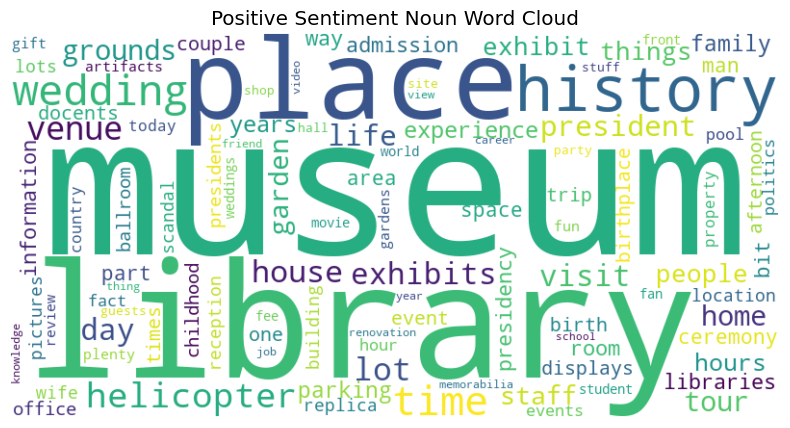

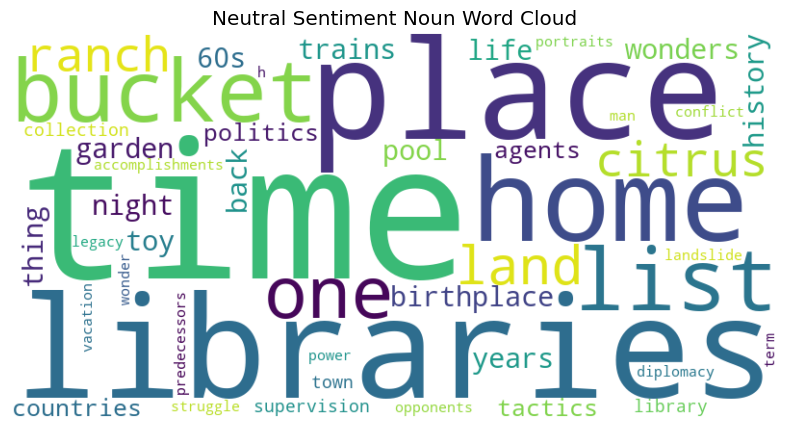

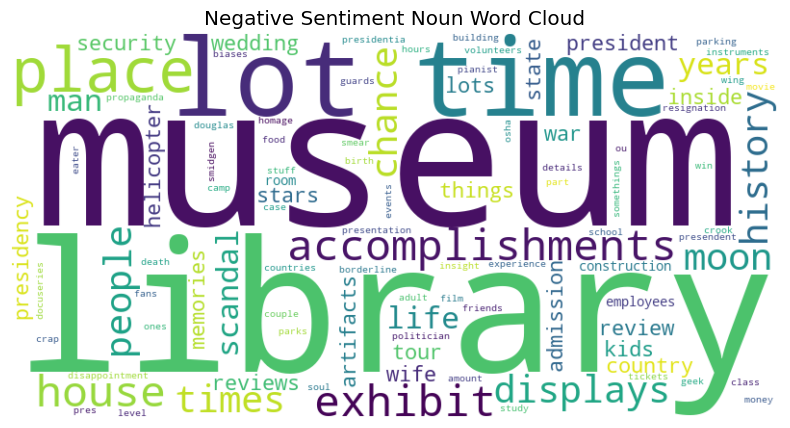

In [50]:
from collections import Counter  # Import the Counter class
from wordcloud import WordCloud  # Import WordCloud
import matplotlib.pyplot as plt
import torch
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import spacy

# Initialize NLTK VADER
sia = SentimentIntensityAnalyzer()

# Initialize Hugging Face Roberta model and tokenizer
model_name = 'roberta-base'
model = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Initialize a list of words to remove
words_to_remove = ["nixon", "museum"]

# Initialize spaCy with a language model (English)
nlp = spacy.load("en_core_web_sm")

# Initialize empty word frequency counters for each sentiment category
positive_word_counts = Counter()
neutral_word_counts = Counter()
negative_word_counts = Counter()

for i, row in df.iterrows():
    text = row['comment']
    vader_result = sia.polarity_scores(text)

    # Truncate or split the text to fit within the model's maximum sequence length
    max_seq_length = model.config.max_position_embeddings
    if len(text) > max_seq_length:
        text = text[:max_seq_length]  # Truncate the text

    roberta_result = model(**tokenizer(text, return_tensors='pt', padding=True, truncation=True))

    # Determine sentiment category (positive, neutral, or negative)
    if vader_result['compound'] >= 0.05:
        sentiment_category = 'positive'
    elif vader_result['compound'] <= -0.05:
        sentiment_category = 'negative'
    else:
        sentiment_category = 'neutral'

    # Process the text with spaCy to extract nouns and update the word frequency counts
    doc = nlp(text)
    nouns = [token.text.lower() for token in doc if token.pos_ == 'NOUN']
    word_counts = Counter(nouns)

    if sentiment_category == 'positive':
        positive_word_counts.update(word_counts)
    elif sentiment_category == 'negative':
        negative_word_counts.update(word_counts)
    else:
        neutral_word_counts.update(word_counts)

# Create word clouds for each sentiment category
def generate_word_cloud(word_counts, title):
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate_from_frequencies(word_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

generate_word_cloud(positive_word_counts, "Positive Sentiment Noun Word Cloud")
generate_word_cloud(neutral_word_counts, "Neutral Sentiment Noun Word Cloud")
generate_word_cloud(negative_word_counts, "Negative Sentiment Noun Word Cloud")


Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classifier.out_proj.bias', 'classifier.dense.bias', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


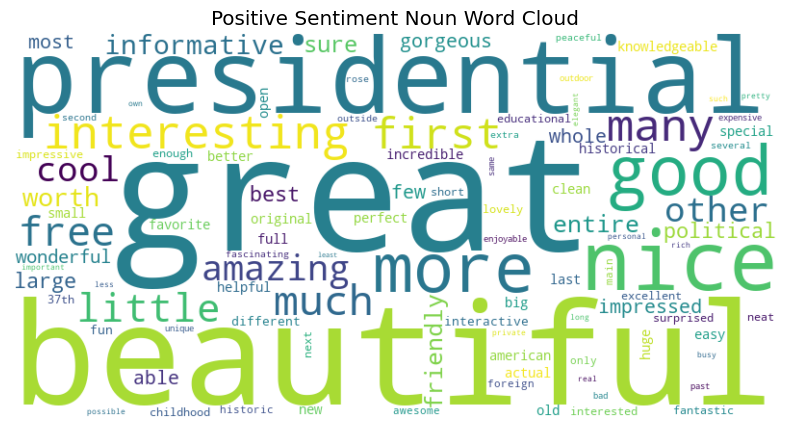

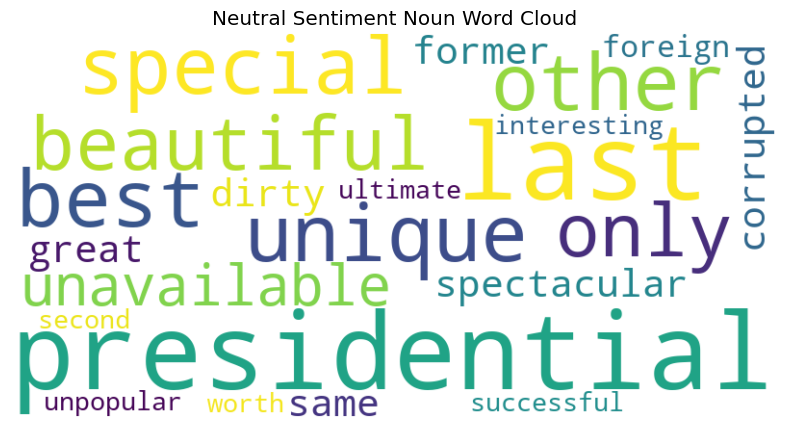

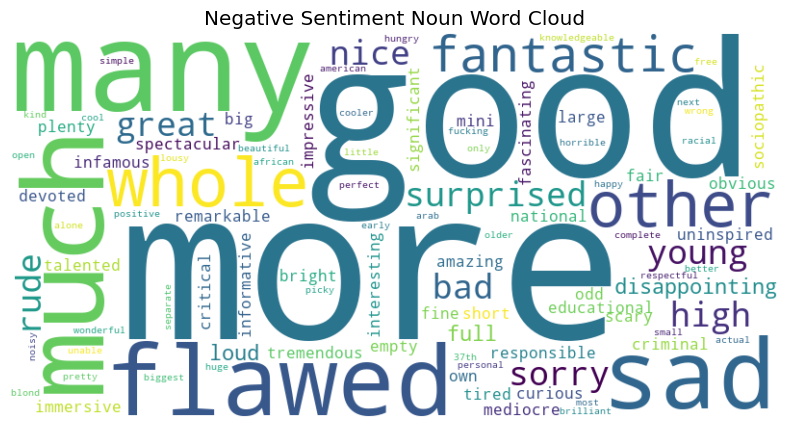

In [63]:
from collections import Counter  # Import the Counter class
from wordcloud import WordCloud  # Import WordCloud
import matplotlib.pyplot as plt
import torch
from transformers import AutoModelForSequenceClassification, AutoTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import spacy

# Initialize NLTK VADER
sia = SentimentIntensityAnalyzer()

# Initialize Hugging Face Roberta model and tokenizer
model_name = 'roberta-base'
model = AutoModelForSequenceClassification.from_pretrained(model_name)
tokenizer = AutoTokenizer.from_pretrained(model_name)

# Initialize a list of words to remove
words_to_remove = ["nixon", "museum"]

# Initialize spaCy with a language model (English)
nlp = spacy.load("en_core_web_sm")

# Initialize empty word frequency counters for each sentiment category
positive_word_counts = Counter()
neutral_word_counts = Counter()
negative_word_counts = Counter()

for i, row in df.iterrows():
    text = row['comment']
    vader_result = sia.polarity_scores(text)

    # Truncate or split the text to fit within the model's maximum sequence length
    max_seq_length = model.config.max_position_embeddings
    if len(text) > max_seq_length:
        text = text[:max_seq_length]  # Truncate the text

    roberta_result = model(**tokenizer(text, return_tensors='pt', padding=True, truncation=True))

    # Determine sentiment category (positive, neutral, or negative)
    if vader_result['compound'] >= 0.05:
        sentiment_category = 'positive'
    elif vader_result['compound'] <= -0.05:
        sentiment_category = 'negative'
    else:
        sentiment_category = 'neutral'

    # Process the text with spaCy to extract nouns and update the word frequency counts
    doc = nlp(text)
    nouns = [token.text.lower() for token in doc if token.pos_ == 'ADJ']
    word_counts = Counter(nouns)

    if sentiment_category == 'positive':
        positive_word_counts.update(word_counts)
    elif sentiment_category == 'negative':
        negative_word_counts.update(word_counts)
    else:
        neutral_word_counts.update(word_counts)

# Create word clouds for each sentiment category
def generate_word_cloud(word_counts, title):
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate_from_frequencies(word_counts)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

generate_word_cloud(positive_word_counts, "Positive Sentiment Noun Word Cloud")
generate_word_cloud(neutral_word_counts, "Neutral Sentiment Noun Word Cloud")
generate_word_cloud(negative_word_counts, "Negative Sentiment Noun Word Cloud")


In [51]:
# Hugging Face transformers pipeline

from transformers import pipeline, AutoTokenizer
import pandas as pd  

# Load the sentiment analysis pipeline and tokenizer
sent_pipeline = pipeline("sentiment-analysis")
tokenizer = AutoTokenizer.from_pretrained("nlptown/bert-base-multilingual-uncased-sentiment")

# Define the maximum sequence length
max_sequence_length = 512  # Adjust to the appropriate value for your model

# Iterate through the comments and calculate sentiment scores
for index, row in merged_df.iterrows():
    comment = row['comment']
    
    # Truncate or split the comment to match the model's input size
    if len(comment) > max_sequence_length:
        comment = comment[:max_sequence_length]  # Truncate the comment
    
    # Tokenize the comment and ensure it matches the model's input size
    encoding = tokenizer(comment, return_tensors='pt', padding='max_length', truncation=True, max_length=max_sequence_length)
    
    # Analyze sentiment using the pipeline with the tokenized input
    input_ids = encoding.input_ids.tolist()  # Convert input_ids to a list
    
    # Use a list of dictionaries for input
    input_data = [{'text': comment}]  # 'text' is the key expected by the pipeline
    sentiment = sent_pipeline(input_data)
    
    # The sentiment variable will contain a list of dictionaries, where each dictionary contains 'label' and 'score'
    # You can extract the 'score' for the first label (positive or negative)
    sentiment_score = sentiment[0]['score']
    merged_df.at[index, 'sentiment_score'] = sentiment_score

# Now, merged_df contains the sentiment scores in the 'sentiment_score' column
print(merged_df)


No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


             name  elite           location  friends  review_count  pictures  \
0      Johnnie C.      1    Los Angeles, CA        2            60        74   
1     Patricia B.      0      Santa Ana, CA        6            47         3   
2         Emil C.      1         Irvine, CA      491          1926     10196   
3           Ed L.      1  Orange County, CA      455           323     10146   
4    Christine M.      1       Whittier, CA      172           141      2118   
..            ...    ...                ...      ...           ...       ...   
451       Anne F.      0    Yorba Linda, CA        0            17         1   
452      Julie S.      0   Palmetto Bay, FL        0             8         0   
453          m c.      0        Ventura, CA        0            26         1   
454       mike s.      0     Long Beach, CA        0           113         0   
455     Kathey B.      0        Anaheim, CA        0             9         0   

     ratings review_date  is_review_upd

In [52]:
import pandas as pd

# Assuming you have your data in a DataFrame called 'merged_df'
# Calculate the difference between 'vader_compound' and 'sentiment_score'
merged_df['score_difference'] = merged_df['vader_compound'] - merged_df['sentiment_score']

# Create a new column to store the comparison result
merged_df['comparison'] = merged_df['score_difference'].apply(lambda x: 'Vader Higher' if x > 0 else 'Sentiment Higher' if x < 0 else 'Equal')

# Display the result
print(merged_df[['vader_compound', 'sentiment_score', 'score_difference', 'comparison']])


     vader_compound  sentiment_score  score_difference        comparison
0            0.9290         0.997384         -0.068384  Sentiment Higher
1            0.9894         0.999758         -0.010358  Sentiment Higher
2            0.9787         0.988610         -0.009910  Sentiment Higher
3            0.7557         0.996310         -0.240610  Sentiment Higher
4            0.9217         0.999821         -0.078121  Sentiment Higher
..              ...              ...               ...               ...
451          0.3182         0.997440         -0.679240  Sentiment Higher
452          0.8650         0.999444         -0.134444  Sentiment Higher
453         -0.4019         0.996390         -1.398290  Sentiment Higher
454         -0.1825         0.991863         -1.174363  Sentiment Higher
455          0.9437         0.997809         -0.054109  Sentiment Higher

[456 rows x 4 columns]


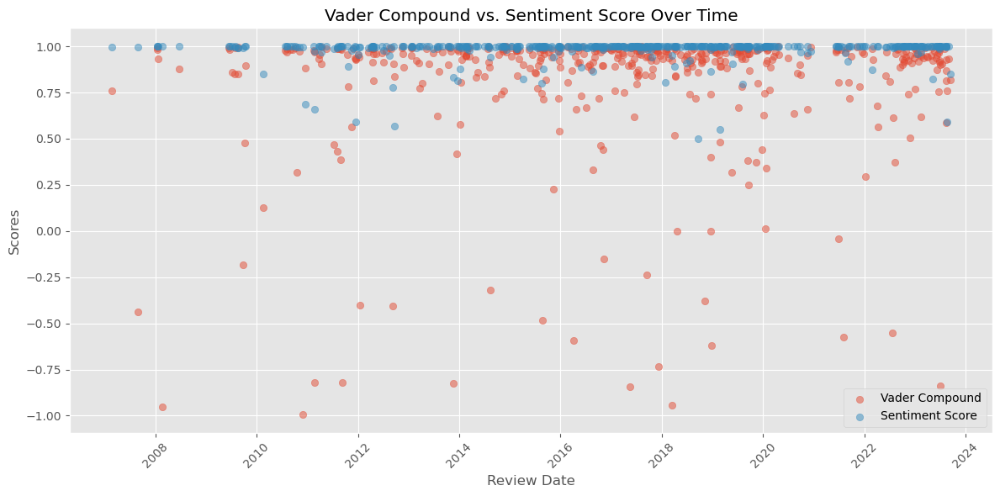

In [53]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have your data in a DataFrame called 'merged_df'
# Make sure the 'review_date' column is in a datetime format
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Create a scatter plot
plt.figure(figsize=(12, 6))
plt.scatter(merged_df['review_date'], merged_df['vader_compound'], label='Vader Compound', alpha=0.5)
plt.scatter(merged_df['review_date'], merged_df['sentiment_score'], label='Sentiment Score', alpha=0.5)

# Set labels and title
plt.xlabel('Review Date')
plt.ylabel('Scores')
plt.title('Vader Compound vs. Sentiment Score Over Time')

# Add a legend
plt.legend()

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()


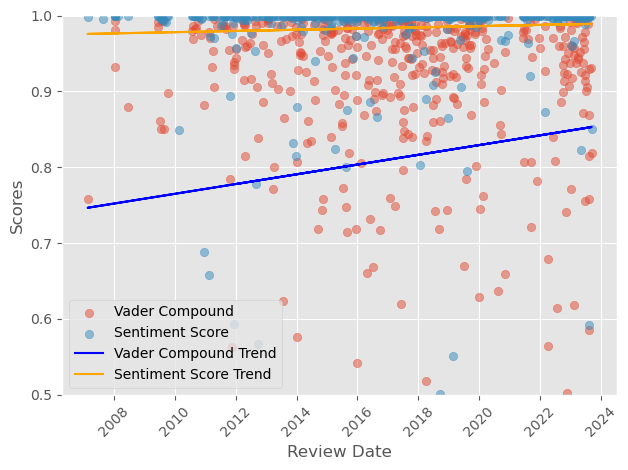

In [54]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Assuming you have your data in a DataFrame called 'merged_df'

# Convert 'review_date' to datetime format
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Set the Y-axis range
plt.ylim(0.5, 1)

# Create a scatter plot for 'vader_compound' and 'sentiment_score'
plt.scatter(merged_df['review_date'], merged_df['vader_compound'], label='Vader Compound', alpha=0.5)
plt.scatter(merged_df['review_date'], merged_df['sentiment_score'], label='Sentiment Score', alpha=0.5)

# Fit trend lines to 'vader_compound' and 'sentiment_score'
regression = LinearRegression()
regression.fit(merged_df['review_date'].values.astype(float).reshape(-1, 1), merged_df['vader_compound'])
vader_trend = regression.predict(merged_df['review_date'].values.astype(float).reshape(-1, 1))
plt.plot(merged_df['review_date'], vader_trend, color='blue', label='Vader Compound Trend')

regression.fit(merged_df['review_date'].values.astype(float).reshape(-1, 1), merged_df['sentiment_score'])
sentiment_trend = regression.predict(merged_df['review_date'].values.astype(float).reshape(-1, 1))
plt.plot(merged_df['review_date'], sentiment_trend, color='orange', label='Sentiment Score Trend')

# Add labels and legend
plt.xlabel('Review Date')
plt.ylabel('Scores')
plt.legend()

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


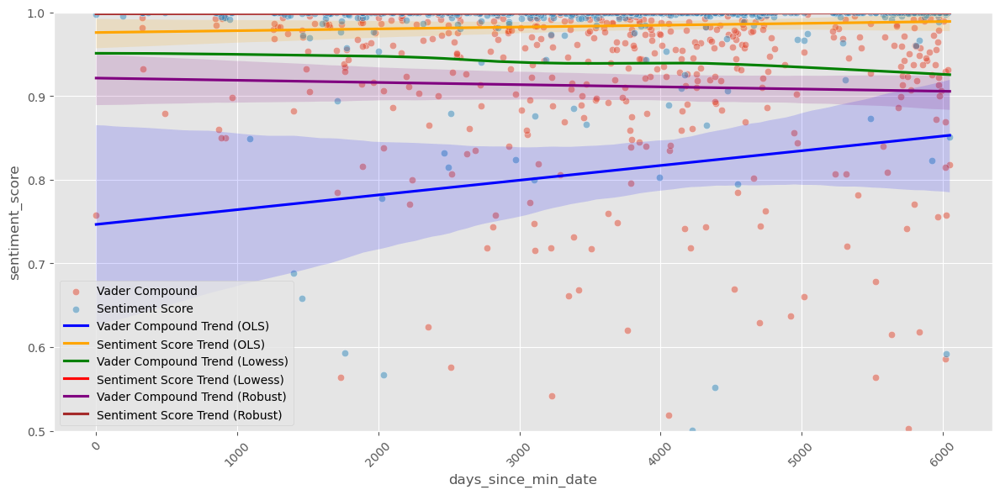

In [55]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have your data in a DataFrame called 'merged_df'

# Convert 'review_date' to datetime format if it's not already
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Calculate the number of days since a reference date (e.g., the minimum date in the 'review_date' column)
min_date = merged_df['review_date'].min()
merged_df['days_since_min_date'] = (merged_df['review_date'] - min_date).dt.days

# Filter 'sentiment_score' within the range [0.5, 1]
filtered_df = merged_df[(merged_df['sentiment_score'] >= 0.5) & (merged_df['sentiment_score'] <= 1)]

# Create a scatter plot
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
scatter_plot = sns.scatterplot(x='days_since_min_date', y='vader_compound', data=filtered_df, label='Vader Compound', alpha=0.5)
sns.scatterplot(x='days_since_min_date', y='sentiment_score', data=filtered_df, label='Sentiment Score', alpha=0.5)

# Add labels and legend
plt.xlabel('Days Since Min Date')
plt.ylabel('Scores')
plt.legend()

# Set the Y-axis range to [0.5, 1]
plt.ylim(0.5, 1)

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Trend line usig OLS (Ordinary least squares regression)
sns.regplot(x='days_since_min_date', y='vader_compound', data=filtered_df, scatter=False, color='blue', label='Vader Compound Trend (OLS)')
sns.regplot(x='days_since_min_date', y='sentiment_score', data=filtered_df, scatter=False, color='orange', label='Sentiment Score Trend (OLS)')

# Use 'lowess' for smoother trend lines
sns.regplot(x='days_since_min_date', y='vader_compound', data=filtered_df, scatter=False, color='green', label='Vader Compound Trend (Lowess)', lowess=True)
sns.regplot(x='days_since_min_date', y='sentiment_score', data=filtered_df, scatter=False, color='red', label='Sentiment Score Trend (Lowess)', lowess=True)

# Use 'robust' for robust regression
sns.regplot(x='days_since_min_date', y='vader_compound', data=filtered_df, scatter=False, color='purple', label='Vader Compound Trend (Robust)', robust=True)
sns.regplot(x='days_since_min_date', y='sentiment_score', data=filtered_df, scatter=False, color='brown', label='Sentiment Score Trend (Robust)', robust=True)

# Show the plot
plt.tight_layout()
plt.legend()
plt.show()


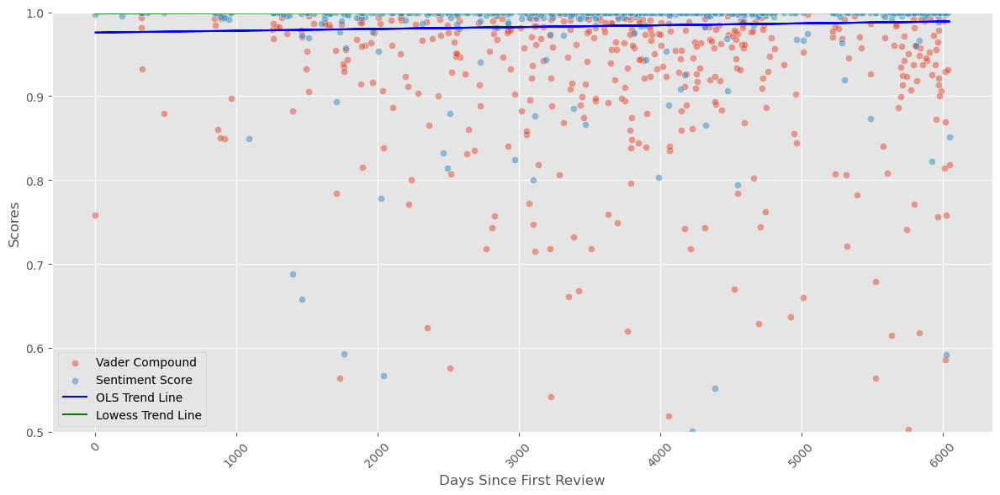

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm

# Assuming you have your data in a DataFrame called 'merged_df'
# Make sure the 'review_date' column is in a datetime format
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Calculate the number of days since the first review
merged_df['days_since_first_review'] = (merged_df['review_date'] - merged_df['review_date'].min()).dt.days

# Filter the data for scores above 0.5
filtered_df = merged_df[(merged_df['sentiment_score'] >= 0.5) & (merged_df['sentiment_score'] <= 1)]

# Create a scatter plot
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
scatter_plot = sns.scatterplot(x='days_since_first_review', y='vader_compound', data=filtered_df, label='Vader Compound', alpha=0.5)
sns.scatterplot(x='days_since_first_review', y='sentiment_score', data=filtered_df, label='Sentiment Score', alpha=0.5)

# Add labels and legend
plt.xlabel('Days Since First Review')
plt.ylabel('Scores')
plt.legend()

# Set the Y-axis range to [0.5, 1]
plt.ylim(0.5, 1)

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Calculate trend lines with different methods
x = filtered_df['days_since_first_review'].values.reshape(-1, 1)
y = filtered_df['sentiment_score'].values

# OLS Trend Line
x_ols = sm.add_constant(x)
ols_model = sm.OLS(y, x_ols).fit()
ols_trend_line = ols_model.predict(x_ols)

# Lowess Trend Line
lowess_trend_line = sm.nonparametric.lowess(y, x.flatten(), frac=0.3)

# Plot trend lines
plt.plot(filtered_df['days_since_first_review'], ols_trend_line, color='blue', label='OLS Trend Line')
plt.plot(lowess_trend_line[:, 0], lowess_trend_line[:, 1], color='green', label='Lowess Trend Line')

# Add legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.legend()
plt.show()


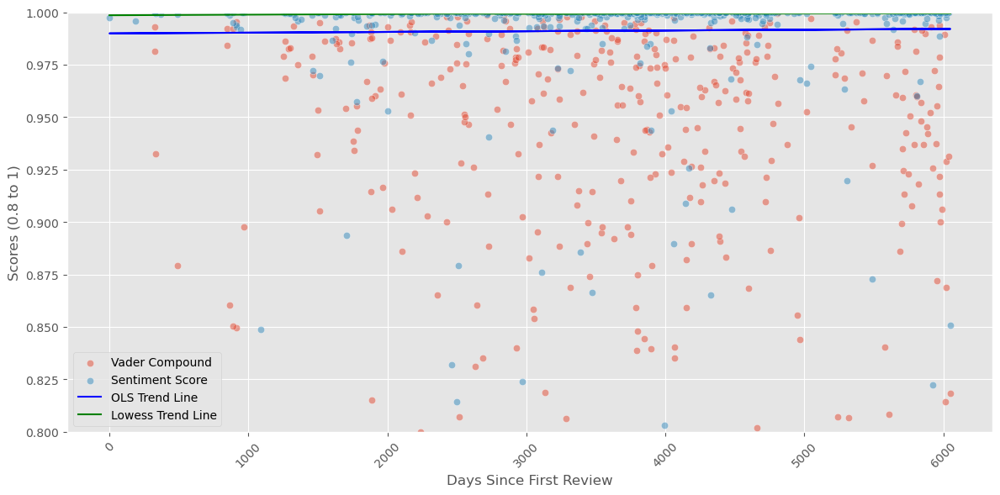

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm

# Assuming you have your data in a DataFrame called 'merged_df'
# Make sure the 'review_date' column is in a datetime format
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Calculate the number of days since the first review
merged_df['days_since_first_review'] = (merged_df['review_date'] - merged_df['review_date'].min()).dt.days

# Filter the data for scores above 0.8 and the date range before February 2020
filtered_df = merged_df[(merged_df['sentiment_score'] >= 0.8) & (merged_df['sentiment_score'] <= 1)]

# Create a scatter plot
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
scatter_plot = sns.scatterplot(x='days_since_first_review', y='vader_compound', data=filtered_df, label='Vader Compound', alpha=0.5)
sns.scatterplot(x='days_since_first_review', y='sentiment_score', data=filtered_df, label='Sentiment Score', alpha=0.5)

# Add labels and legend
plt.xlabel('Days Since First Review')
plt.ylabel('Scores (0.8 to 1)')
plt.legend()

# Set the Y-axis range to [0.8, 1]
plt.ylim(0.8, 1)

# Rotate x-axis labels for better readability (optional)
plt.xticks(rotation=45)

# Calculate trend lines with different methods
x = filtered_df['days_since_first_review'].values.reshape(-1, 1)
y = filtered_df['sentiment_score'].values

# OLS Trend Line
x_ols = sm.add_constant(x)
ols_model = sm.OLS(y, x_ols).fit()
ols_trend_line = ols_model.predict(x_ols)

# Lowess Trend Line
lowess_trend_line = sm.nonparametric.lowess(y, x.flatten(), frac=0.3)

# Plot trend lines
plt.plot(filtered_df['days_since_first_review'], ols_trend_line, color='blue', label='OLS Trend Line')
plt.plot(lowess_trend_line[:, 0], lowess_trend_line[:, 1], color='green', label='Lowess Trend Line')

# Add legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.legend()
plt.show()


C:\ProgramData\miniconda3\envs\SA\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\ProgramData\miniconda3\envs\SA\Lib\site-packages\scipy\optimize\_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


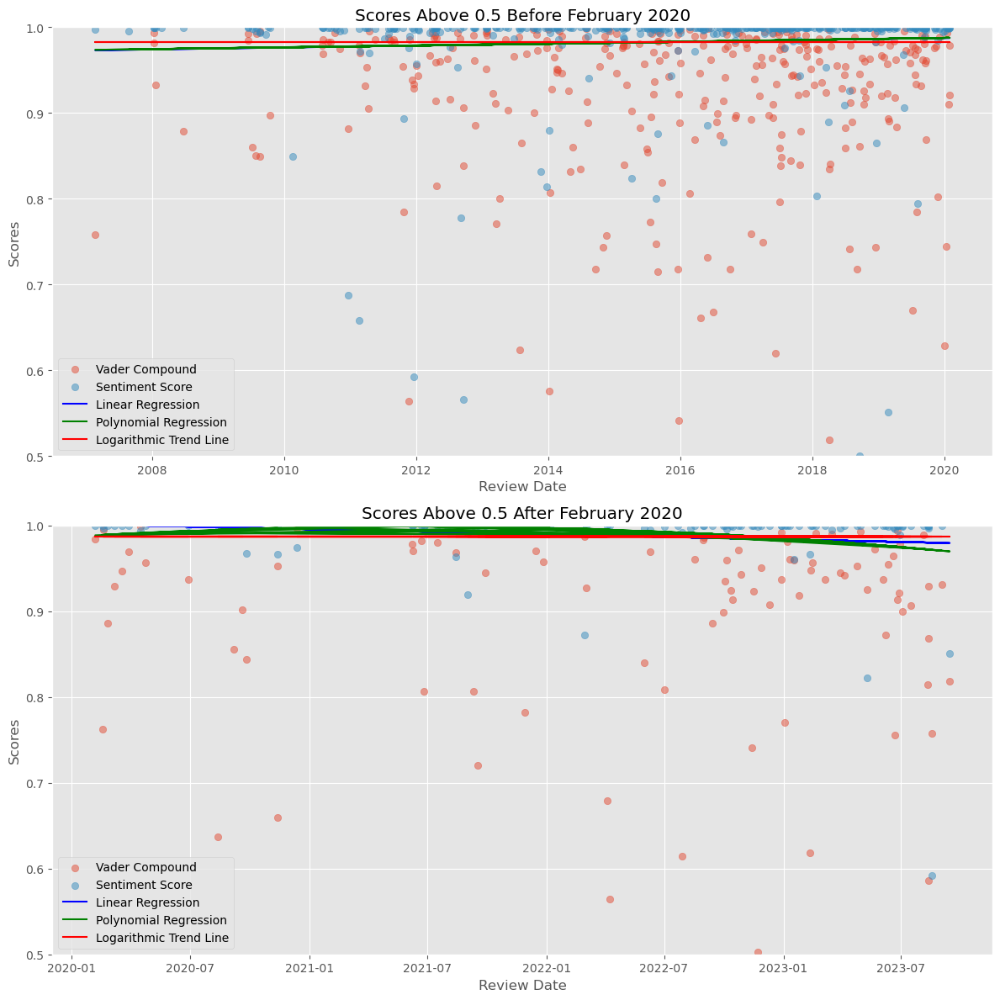

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from scipy.optimize import curve_fit

# Assuming you have your data in a DataFrame called 'merged_df'
# Make sure the 'review_date' column is in a datetime format
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Filter the data for scores above 0.5 and the date range before February 2020
before_feb_2020 = merged_df[(merged_df['sentiment_score'] >= 0.5) & (merged_df['sentiment_score'] <= 1) & (merged_df['review_date'] < '2020-02-01')]

# Filter the data for scores above 0.5 and the date range after February 2020
after_feb_2020 = merged_df[(merged_df['sentiment_score'] >= 0.5) & (merged_df['sentiment_score'] <= 1) & (merged_df['review_date'] >= '2020-02-01')]

# Create two separate scatter plots
plt.figure(figsize=(12, 12))

# First subplot for scores before February 2020
plt.subplot(2, 1, 1)
plt.scatter(before_feb_2020['review_date'], before_feb_2020['vader_compound'], label='Vader Compound', alpha=0.5)
plt.scatter(before_feb_2020['review_date'], before_feb_2020['sentiment_score'], label='Sentiment Score', alpha=0.5)
plt.xlabel('Review Date')
plt.ylabel('Scores')
plt.title('Scores Above 0.5 Before February 2020')
plt.ylim(0.5, 1)  # Set Y-axis limits to [0.5, 1]
plt.legend()

# Calculate trend lines with different methods
x = before_feb_2020['review_date'].apply(lambda x: x.toordinal()).values.reshape(-1, 1)
y = before_feb_2020['sentiment_score'].values
linear_reg = LinearRegression().fit(x, y)
poly_reg = PolynomialFeatures(degree=2)
x_poly = poly_reg.fit_transform(x)
poly_reg.fit(x_poly, y)
lin_reg = LinearRegression()
lin_reg.fit(x_poly, y)
logistic_func = lambda x, a, b, c: a / (1 + np.exp(-b * (x - c)))
popt, _ = curve_fit(logistic_func, x.flatten(), y)

# Plot trend lines
plt.plot(before_feb_2020['review_date'], linear_reg.predict(x), color='blue', label='Linear Regression')
plt.plot(before_feb_2020['review_date'], lin_reg.predict(x_poly), color='green', label='Polynomial Regression')
plt.plot(before_feb_2020['review_date'], logistic_func(x.flatten(), *popt), color='red', label='Logarithmic Trend Line')

# Add legend
plt.legend()

# Second subplot for scores after February 2020
plt.subplot(2, 1, 2)
plt.scatter(after_feb_2020['review_date'], after_feb_2020['vader_compound'], label='Vader Compound', alpha=0.5)
plt.scatter(after_feb_2020['review_date'], after_feb_2020['sentiment_score'], label='Sen  timent Score', alpha=0.5)
plt.xlabel('Review Date')
plt.ylabel('Scores')
plt.title('Scores Above 0.5 After February 2020')
plt.ylim(0.5, 1)  # Set Y-axis limits to [0.5, 1]
plt.legend()

# Calculate trend lines with different methods
x = after_feb_2020['review_date'].apply(lambda x: x.toordinal()).values.reshape(-1, 1)
y = after_feb_2020['sentiment_score'].values
linear_reg = LinearRegression().fit(x, y)
poly_reg = PolynomialFeatures(degree=2)
x_poly = poly_reg.fit_transform(x)
poly_reg.fit(x_poly, y)
lin_reg = LinearRegression()
lin_reg.fit(x_poly, y)
logistic_func = lambda x, a, b, c: a / (1 + np.exp(-b * (x - c)))
popt, _ = curve_fit(logistic_func, x.flatten(), y)

# Plot trend lines
plt.plot(after_feb_2020['review_date'], linear_reg.predict(x), color='blue', label='Linear Regression')
plt.plot(after_feb_2020['review_date'], lin_reg.predict(x_poly), color='green', label='Polynomial Regression')
plt.plot(after_feb_2020['review_date'], logistic_func(x.flatten(), *popt), color='red', label='Logarithmic Trend Line')

# Add legend
plt.legend()

# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()


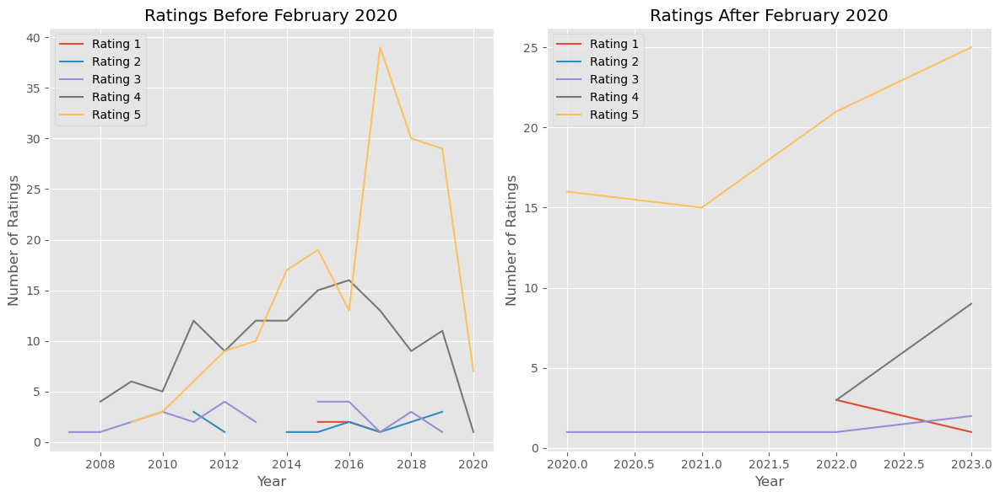

In [59]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert 'review_date' column to datetime
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Filter data for before and after February 2020
before_2020 = merged_df[merged_df['review_date'] < '2020-02-01']
after_2020 = merged_df[merged_df['review_date'] >= '2020-02-01']

# Group data by year and rating
before_2020_grouped = before_2020.groupby([before_2020['review_date'].dt.year, 'ratings'])['name'].count().unstack()
after_2020_grouped = after_2020.groupby([after_2020['review_date'].dt.year, 'ratings'])['name'].count().unstack()

# Create a plot for before February 2020
plt.figure(figsize=(12, 6))
plt.subplot(121)  # Subplot 1 for before 2020
for rating in range(1, 6):
    plt.plot(before_2020_grouped.index, before_2020_grouped[rating], label=f'Rating {rating}')

plt.xlabel('Year')
plt.ylabel('Number of Ratings')
plt.title('Ratings Before February 2020')
plt.legend()
plt.grid(True)

# Create a plot for after February 2020
plt.subplot(122)  # Subplot 2 for after 2020
for rating in range(1, 6):
    plt.plot(after_2020_grouped.index, after_2020_grouped[rating], label=f'Rating {rating}')

plt.xlabel('Year')
plt.ylabel('Number of Ratings')
plt.title('Ratings After February 2020')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


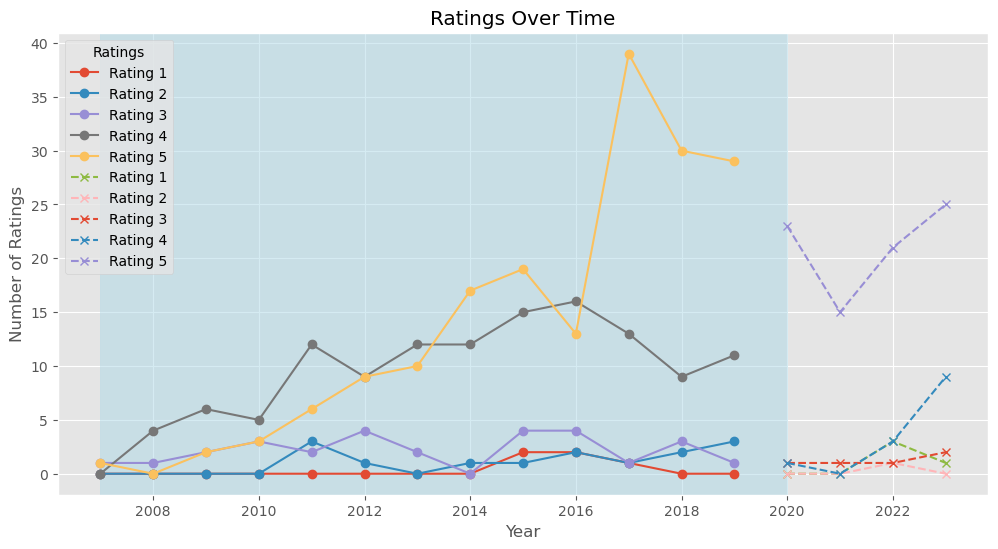

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert the 'review_date' column to a datetime object
merged_df['review_date'] = pd.to_datetime(merged_df['review_date'])

# Extract the year and month from the 'review_date' column
merged_df['year'] = merged_df['review_date'].dt.year

# Create a pivot table to count ratings for each year and rating category
rating_counts = merged_df.pivot_table(index='year', columns='ratings', values='name', aggfunc='count', fill_value=0)

# Separate the data before and after February 2020
before_feb_2020 = rating_counts[rating_counts.index < 2020]
after_feb_2020 = rating_counts[rating_counts.index >= 2020]

# Create a line chart with different background colors
plt.figure(figsize=(12, 6))

# Background color for the period before February 2020
plt.axvspan(before_feb_2020.index.min(), 2020, color='lightblue', alpha=0.5)

# Plot five different lines for each rating category
for rating in range(1, 6):
    plt.plot(before_feb_2020.index, before_feb_2020[rating], label=f'Rating {rating}', marker='o')

for rating in range(1, 6):
    plt.plot(after_feb_2020.index, after_feb_2020[rating], label=f'Rating {rating}', linestyle='--', marker='x')

plt.title('Ratings Over Time')
plt.xlabel('Year')
plt.ylabel('Number of Ratings')
plt.legend(title='Ratings')
plt.grid(True)
plt.show()


In [61]:
# Export the results_df DataFrame to an Excel file
merged_df.to_excel("yelp_results_huggingface&Vader.xlsx", index=False)

In [62]:
#download excel
excel_filename = "yelp_results_huggingface&Vader.xlsx"
display(FileLink(excel_filename))

C:\Users\naren\OneDrive\Desktop\Nixon library Project\yelp_results_huggingface&Vader.xlsx